# Starbuck Capstone Project

![Image Description](https://miro.medium.com/v2/resize:fit:1224/format:webp/1*lv_IE5h2CnUEVUOmK_dgpg.jpeg)


## Introduction
This project is my Capstone Challenge for Udacity’s Data Scientist Nanodegree. The project is in collaboration with Starbucks where we were given simulated data that mimics customer behavior on the Starbucks rewards app. The offer could be purely informational or it could include a discount such as BOGO (buy one get one free).

From the data we received, it appears that Starbucks sent 10 different offers to its customers via a variety of different channels.

## Datasets
For this project, we received 3 datasets:

1. Portfolio: dataset describing the characteristics of each offer type, including its offer type, difficulty, and duration.
2. Profile: dataset containing information regarding customer demographics including age, gender, income, and the date they created an account for Starbucks Rewards.
3. Transcript: dataset containing all the instances when a customer made a purchase, viewed an offer, received an offer, and completed an offer. It's important to note that if a customer completed an offer but never actually viewed the offer, then this does not count as a successful offer as the offer could not have changed the outcome.

## Project Overview
The purpose of this project is to complete an exploratory analysis to determine which demographic group responds best to which offer type. I will also create and compare different predictive models to evaluate which features contribute to a successful offer.

## Performance Metrics
The performance of each trained predictive model was measured using a test dataset. As this was a binary classification outcome, I used AUC, accuracy, f1 score, and confusion matrix as the performance metrics.

# Importing packages

In [1]:
# Data manipulation and analysis
import pandas as pd
import numpy as np

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Statistical analysis
from scipy.stats import ttest_ind

# Machine learning (if applicable)
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Other useful packages
import datetime
import warnings
warnings.filterwarnings('ignore')  # To ignore any warnings for cleaner output


In [2]:
portfolio_df=pd.read_csv('archive/portfolio.csv')
profile_df=pd.read_csv('archive/profile.csv')
transcript_df=pd.read_csv('archive/transcript.csv')

## Exploring the Dataset

- Import the dataset using pandas.
- Display the first few rows to get an overview.
- Check for missing values and handle them if necessary.
- Explore basic statistics of the dataset.
- Visualize key aspects of the data to gain insights.


**portfolio.json**

- id (string): offer id
- offer_type (string): type of offer (BOGO, discount, informational)
- difficulty (int): minimum required spend to complete an offer
- reward (int): reward given for completing an offer
- duration (int): time for offer to be open, in days
- channels (list of strings)

**profile.json**

- age (int): age of the customer
- became_member_on (int): date when customer created an app account
- gender (str): gender of the customer (note: some entries contain 'O' for other rather than M or F)
- id (str): customer id
- income (float): customer's income

**transcript.json**

- event (str): record description (transaction, offer received, offer viewed, etc.)
- person (str): customer id
- time (int): time in hours since start of test. The data begins at time t=0
- value (dict of strings): either an offer id or transaction amount depending on the record


### Exploratory portofolio dataset

In [3]:
portfolio_df.head()

,reward,channels/0,channels/1,channels/2,difficulty,duration,offer_type,id,channels/3
0,10,email,mobile,social,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,NaN
1,10,web,email,mobile,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,social
2,0,web,email,mobile,0,4,informational,3f207df678b143eea3cee63160fa8bed,NaN
3,5,web,email,mobile,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,NaN
4,5,web,email,NaN,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN


In [4]:
portfolio_df.shape

(10, 9)

In [5]:
portfolio_df.isnull().sum()

reward        0
channels/0    0
channels/1    0
channels/2    1
difficulty    0
duration      0
offer_type    0
id            0
channels/3    6
dtype: int64

In [6]:
portfolio_df.value_counts()

reward  channels/0  channels/1  channels/2  difficulty  duration  offer_type  id                                channels/3
2       web         email       mobile      10          10        discount    fafdcd668e3743c1bb461111dcafc2a4  social        1
3       web         email       mobile      7           7         discount    2298d6c36e964ae4a3e7e9706d1fb8c2  social        1
5       web         email       mobile      5           5         bogo        f19421c1d4aa40978ebb69ca19b0e20d  social        1
10      web         email       mobile      10          5         bogo        4d5c57ea9a6940dd891ad53e9dbe8da0  social        1
Name: count, dtype: int64

In [7]:
#exploring data type of each column
portfolio_df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   reward      10 non-null     int64 
 1   channels/0  10 non-null     object
 2   channels/1  10 non-null     object
 3   channels/2  9 non-null      object
 4   difficulty  10 non-null     int64 
 5   duration    10 non-null     int64 
 6   offer_type  10 non-null     object
 7   id          10 non-null     object
 8   channels/3  4 non-null      object
dtypes: int64(3), object(6)
memory usage: 852.0+ bytes


In [8]:
#checking for duplicates
portfolio_df.duplicated().sum()

0

In [9]:
#checking for null values
portfolio_df.isnull().sum()

reward        0
channels/0    0
channels/1    0
channels/2    1
difficulty    0
duration      0
offer_type    0
id            0
channels/3    6
dtype: int64

In [10]:
#   Exploring portfolio data
portfolio_df.describe()

,reward,difficulty,duration
count,10.000000,10.000000,10.000000
mean,4.200000,7.700000,6.500000
std,3.583915,5.831905,2.321398
min,0.000000,0.000000,3.000000
25%,2.000000,5.000000,5.000000
50%,4.000000,8.500000,7.000000
75%,5.000000,10.000000,7.000000
max,10.000000,20.000000,10.000000


In [11]:
portfolio_df.describe(include='object') #for categorical data

,channels/0,channels/1,channels/2,offer_type,id,channels/3
count,10,10,9,10,10,4
unique,2,2,2,3,10,1
top,web,email,mobile,bogo,ae264e3637204a6fb9bb56bc8210ddfd,social
freq,8,8,7,4,1,4


In [12]:
# checking the percentage of null values
portfolio_df.isnull().sum()/len(portfolio_df)*100

reward         0.0
channels/0     0.0
channels/1     0.0
channels/2    10.0
difficulty     0.0
duration       0.0
offer_type     0.0
id             0.0
channels/3    60.0
dtype: float64

In [13]:
#checking for unique values
portfolio_df.nunique()

reward         5
channels/0     2
channels/1     2
channels/2     2
difficulty     5
duration       5
offer_type     3
id            10
channels/3     1
dtype: int64

In [14]:
portfolio_df.head(100)

,reward,channels/0,channels/1,channels/2,difficulty,duration,offer_type,id,channels/3
0,10,email,mobile,social,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,NaN
1,10,web,email,mobile,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,social
2,0,web,email,mobile,0,4,informational,3f207df678b143eea3cee63160fa8bed,NaN
3,5,web,email,mobile,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,NaN
4,5,web,email,NaN,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN
5,3,web,email,mobile,7,7,discount,2298d6c36e964ae4a3e7e9706d1fb8c2,social
6,2,web,email,mobile,10,10,discount,fafdcd668e3743c1bb461111dcafc2a4,social
7,0,email,mobile,social,0,3,informational,5a8bc65990b245e5a138643cd4eb9837,NaN
8,5,web,email,mobile,5,5,bogo,f19421c1d4aa40978ebb69ca19b0e20d,social
9,2,web,email,mobile,10,7,discount,2906b810c7d4411798c6938adc9daaa5,NaN


I see that the channels column has multiple values in it. I will split the values into different columns.

### Exploring profile data

In [15]:
profile_df.head()

,gender,age,id,became_member_on,income
0,NaN,118,68be06ca386d4c31939f3a4f0e3dd783,20170212,NaN
1,F,55,0610b486422d4921ae7d2bf64640c50b,20170715,112000.0
2,NaN,118,38fe809add3b4fcf9315a9694bb96ff5,20180712,NaN
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,20170509,100000.0
4,NaN,118,a03223e636434f42ac4c3df47e8bac43,20170804,NaN


In [16]:
profile_df.shape

(17000, 5)

In [17]:
profile_df.became_member_on.value_counts()

became_member_on
20171207    43
20170819    42
20171007    40
20171113    39
20170928    38
            ..
20141212     1
20140412     1
20140621     1
20141023     1
20130922     1
Name: count, Length: 1716, dtype: int64

In [18]:
profile_df.describe() #for numerical data

,age,became_member_on,income
count,17000.000000,1.700000e+04,14825.000000
mean,62.531412,2.016703e+07,65404.991568
std,26.738580,1.167750e+04,21598.299410
min,18.000000,2.013073e+07,30000.000000
25%,45.000000,2.016053e+07,49000.000000
50%,58.000000,2.017080e+07,64000.000000
75%,73.000000,2.017123e+07,80000.000000
max,118.000000,2.018073e+07,120000.000000


In [19]:
profile_df.describe(include='object') #for categorical data

,gender,id
count,14825,17000
unique,3,17000
top,M,68be06ca386d4c31939f3a4f0e3dd783
freq,8484,1


In [20]:
#checking for null values
profile_df.isnull().sum().sort_values(ascending=False)/len(profile_df)*100

gender              12.794118
income              12.794118
age                  0.000000
id                   0.000000
became_member_on     0.000000
dtype: float64

In [21]:
profile_df.age.value_counts()

age
118    2175
58      408
53      372
51      363
54      359
       ... 
100      12
96        8
98        5
101       5
99        5
Name: count, Length: 85, dtype: int64

In [22]:
profile_df.age.isnull().sum()

0

In [23]:
profile_df.gender.value_counts()

gender
M    8484
F    6129
O     212
Name: count, dtype: int64

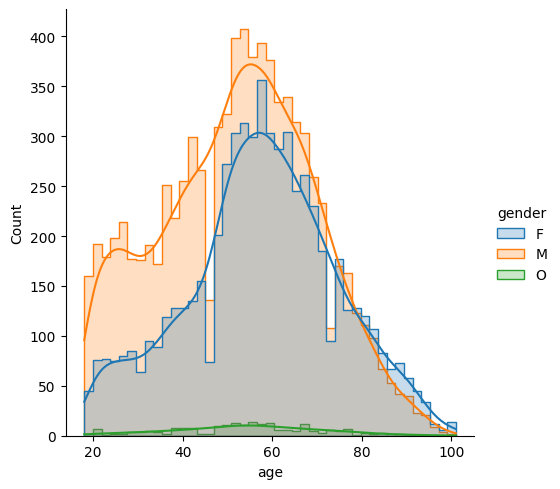

In [24]:
# Show age by gender displot distributions
sns.displot(profile_df, x="age", hue="gender", element="step", kde = True)

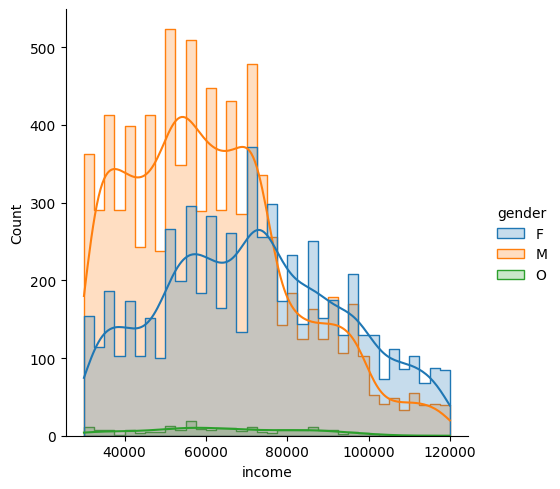

In [25]:
# Show income by gender displot distributions
sns.displot(profile_df, x="income", hue="gender", element="step", kde = True)

Income distribution between genders show us that exists most of men in 40k-75k stripe aproxymately but are most of women from 75k to 120k in $ per year.



In [26]:
# plt.hist(profile_df['became_member_on']);
# plt.title('Distribution of The Number of Days a User Has Been a Member');


### Exploring transcript dataset

In [27]:
transcript_df.head()

,person,event,value/offer id,time,value/amount,value/offer_id,value/reward
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,9b98b8c7a33c4b65b9aebfe6a799e6d9,0,NaN,NaN,NaN
1,a03223e636434f42ac4c3df47e8bac43,offer received,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,NaN,NaN,NaN
2,e2127556f4f64592b11af22de27a7932,offer received,2906b810c7d4411798c6938adc9daaa5,0,NaN,NaN,NaN
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,fafdcd668e3743c1bb461111dcafc2a4,0,NaN,NaN,NaN
4,68617ca6246f4fbc85e91a2a49552598,offer received,4d5c57ea9a6940dd891ad53e9dbe8da0,0,NaN,NaN,NaN


In [28]:
transcript_df.duplicated().sum()

19997

In [29]:
#checking for null values
transcript_df.isnull().sum().sort_values(ascending=False)/len(transcript_df)*100

value/offer_id    93.037679
value/reward      93.037679
value/amount      71.785595
value/offer id    35.176726
person             0.000000
event              0.000000
time               0.000000
dtype: float64

In [30]:
transcript_df.describe() #for numerical data

,time,value/amount,value/reward
count,59980.000000,16923.000000,4176.000000
mean,17.428610,12.721589,5.072079
std,25.467678,29.764303,2.991937
min,0.000000,0.050000,2.000000
25%,0.000000,2.860000,2.000000
50%,0.000000,9.050000,5.000000
75%,30.000000,17.960000,5.000000
max,90.000000,962.100000,10.000000


In [31]:
transcript_df.describe(include='object') #for categorical data

,person,event,value/offer id,value/offer_id
count,59980,59980,38881,4176
unique,14173,4,10,8
top,a95c94e9e8444d3ea4e10d2b96c6bba4,offer received,fafdcd668e3743c1bb461111dcafc2a4,f19421c1d4aa40978ebb69ca19b0e20d
freq,15,25300,4555,703


In [32]:
transcript_df.info()#exploring data type of each column

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59980 entries, 0 to 59979
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   person          59980 non-null  object 
 1   event           59980 non-null  object 
 2   value/offer id  38881 non-null  object 
 3   time            59980 non-null  int64  
 4   value/amount    16923 non-null  float64
 5   value/offer_id  4176 non-null   object 
 6   value/reward    4176 non-null   float64
dtypes: float64(2), int64(1), object(4)
memory usage: 3.2+ MB


In [33]:
transcript_df.event.value_counts()

event
offer received     25300
transaction        16923
offer viewed       13581
offer completed     4176
Name: count, dtype: int64

I see that there are 4 types of events in the transcript data. I will create 4 dataframes for each event type.

## Data Cleaning

**Portfolio Dataframe Tasks:**

- Split the channels into several columns.
- Split offer_type into several columns.
- Change the id column name to offer_id.

I will start with the portfolio dataset 

#### cleaning data

In [34]:
#rename id column to offer_id
portfolio_df.rename(columns={'id':'offer_id'},inplace=True)

In [35]:
portfolio_df['channels/0'].value_counts()

channels/0
web      8
email    2
Name: count, dtype: int64

In [36]:
portfolio_df['channels/1'].value_counts()

channels/1
email     8
mobile    2
Name: count, dtype: int64

In [37]:
portfolio_df['channels/2'].value_counts()

channels/2
mobile    7
social    2
Name: count, dtype: int64

based on the data above I notice that there are 4 channels that are used to send offers to customers. I will rename the columns to make it easier to work with.

In [38]:
# explorint portfolio dataset
portfolio_df.head()

,reward,channels/0,channels/1,channels/2,difficulty,duration,offer_type,offer_id,channels/3
0,10,email,mobile,social,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,NaN
1,10,web,email,mobile,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,social
2,0,web,email,mobile,0,4,informational,3f207df678b143eea3cee63160fa8bed,NaN
3,5,web,email,mobile,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,NaN
4,5,web,email,NaN,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN


### Spliting channels column to new 4 columns

first, to do that I will concatenate the channels to make it easier to spilt then into 4 columns

In [39]:
# concatenating channels column to list in one column
portfolio_df['channels'] = portfolio_df[['channels/0', 'channels/1', 'channels/2', 'channels/3']].values.tolist()
# dropping channels/0, channels/1, channels/2, channels/3 columns
portfolio_df.drop(columns=['channels/0', 'channels/1', 'channels/2', 'channels/3'], inplace=True)


In [40]:
# creating dummy variables for channels column
channels_df = pd.get_dummies(portfolio_df['channels'].apply(pd.Series).stack(), prefix="channel").groupby(level=0).sum()
# concatenating channels_df to portfolio_df
portfolio_df = pd.concat([portfolio_df, channels_df], axis=1)
# dropping channels column
portfolio_df.drop(columns='channels', inplace=True)


In [41]:
portfolio_df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   reward          10 non-null     int64 
 1   difficulty      10 non-null     int64 
 2   duration        10 non-null     int64 
 3   offer_type      10 non-null     object
 4   offer_id        10 non-null     object
 5   channel_email   10 non-null     int64 
 6   channel_mobile  10 non-null     int64 
 7   channel_social  10 non-null     int64 
 8   channel_web     10 non-null     int64 
dtypes: int64(7), object(2)
memory usage: 852.0+ bytes


In [42]:
portfolio_df.head()

,reward,difficulty,duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web
0,10,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0
1,10,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1
2,0,0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1
3,5,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1
4,5,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1


second, I see that there are 3 offer type Starbucks make to customer,so I will split them to 3 coulmn.

### Spliting offer_type to new 3 columns

In [43]:
offer_type_df = pd.get_dummies(portfolio_df['offer_type'])
portfolio_df = pd.concat([portfolio_df, offer_type_df], axis=1)


In [44]:
portfolio_df.offer_type.value_counts()

offer_type
bogo             4
discount         4
informational    2
Name: count, dtype: int64

In [45]:
portfolio_df.head()

,reward,difficulty,duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,bogo,discount,informational
0,10,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0,True,False,False
1,10,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1,True,False,False
2,0,0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1,False,False,True
3,5,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1,True,False,False
4,5,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1,False,True,False


In [46]:
# Change column name from 'id' to 'offer_id'
portfolio_df.rename(columns={'id': 'offer_id'}, inplace=True)

In [47]:
# portfolio_df.drop(columns='offer_type', inplace=True)
portfolio_df['bogo'] = (portfolio_df['bogo'] == 1).astype(int)
portfolio_df['discount'] = (portfolio_df['discount'] == 1).astype(int)
portfolio_df['informational'] = (portfolio_df['informational'] == 1).astype(int)


In [48]:
portfolio_df.head()

,reward,difficulty,duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,bogo,discount,informational
0,10,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0,1,0,0
1,10,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1,1,0,0
2,0,0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1,0,0,1
3,5,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1,1,0,0
4,5,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1,0,1,0


### Cleaning profile dataset


**Profile Dataframe Tasks:**
- Fix the date
- Change the column name id to customer_id.
- There are 2,175 missing values in the gender and income columns



In [49]:
profile_df.head()

,gender,age,id,became_member_on,income
0,NaN,118,68be06ca386d4c31939f3a4f0e3dd783,20170212,NaN
1,F,55,0610b486422d4921ae7d2bf64640c50b,20170715,112000.0
2,NaN,118,38fe809add3b4fcf9315a9694bb96ff5,20180712,NaN
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,20170509,100000.0
4,NaN,118,a03223e636434f42ac4c3df47e8bac43,20170804,NaN


In [50]:
profile_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17000 entries, 0 to 16999
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            14825 non-null  object 
 1   age               17000 non-null  int64  
 2   id                17000 non-null  object 
 3   became_member_on  17000 non-null  int64  
 4   income            14825 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 664.2+ KB


In [51]:
#change the column name from 'id' to 'customer_id'
profile_df.rename(columns={'id':'customer_id'},inplace=True)

In [52]:
#change the column name from 'id' to 'off'
profile_df.head()

,gender,age,customer_id,became_member_on,income
0,NaN,118,68be06ca386d4c31939f3a4f0e3dd783,20170212,NaN
1,F,55,0610b486422d4921ae7d2bf64640c50b,20170715,112000.0
2,NaN,118,38fe809add3b4fcf9315a9694bb96ff5,20180712,NaN
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,20170509,100000.0
4,NaN,118,a03223e636434f42ac4c3df47e8bac43,20170804,NaN


In [53]:
len(profile_df.customer_id)

17000

In [54]:
len(profile_df.customer_id.unique())

17000

In [55]:
len(profile_df)

17000

In [56]:
#convert became_member_on column to datetime
profile_df['became_member_on'] = pd.to_datetime(profile_df['became_member_on'], format='%Y%m%d')

In [57]:
profile_df['year'] = profile_df['became_member_on'].dt.year
profile_df['month'] = profile_df['became_member_on'].dt.month
profile_df['day'] = profile_df['became_member_on'].dt.day


In [58]:
profile_df.became_member_on.head()

0   2017-02-12
1   2017-07-15
2   2018-07-12
3   2017-05-09
4   2017-08-04
Name: became_member_on, dtype: datetime64[ns]

Text(0.5, 1.0, 'Subsciptions by Month and Year')

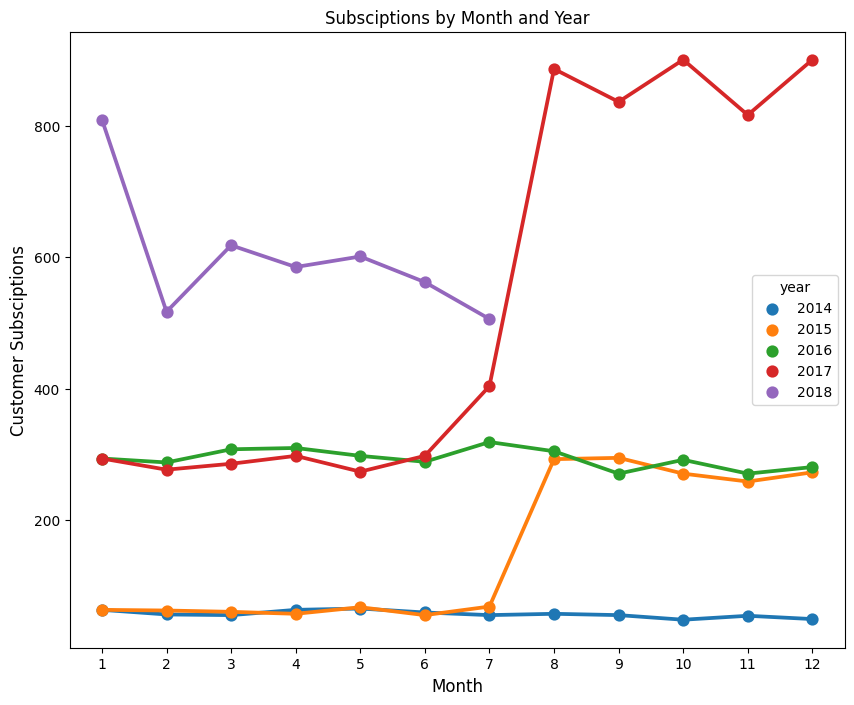

In [59]:
# variare con mese-anno
membership_subs = profile_df[profile_df['year'] >= 2014].groupby(['year','month'], as_index=False).agg({'customer_id':'count'})
plt.figure(figsize=(10,8))
sns.pointplot(x="month", y="customer_id", hue="year", data = membership_subs)
plt.ylabel('Customer Subsciptions', fontsize = 12)
plt.xlabel('Month', fontsize = 12)
plt.title('Subsciptions by Month and Year')

In [60]:
#Extract the number of days a user has been a member of the rewards app.
import datetime
import datetime as dt
today = pd.to_datetime(datetime.datetime.today().strftime('%Y%m%d')) #get today's date
profile_df['became_member_on'] = (today - profile_df['became_member_on']) / np.timedelta64(1,'D')

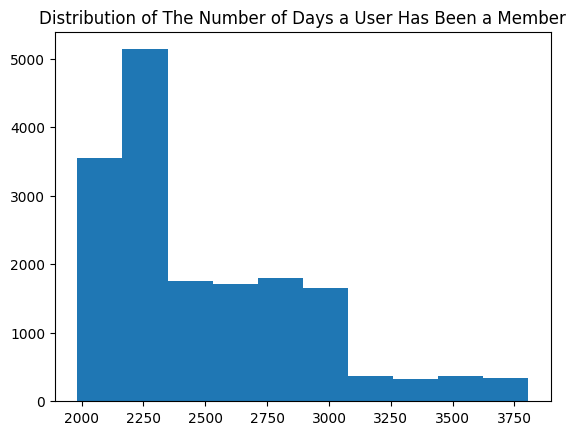

In [61]:
plt.hist(profile_df['became_member_on']);
plt.title('Distribution of The Number of Days a User Has Been a Member');

In [62]:
#drop the column 'became_member_on'
# profile_df.drop(columns='became_member_on',inplace=True)

In [63]:
profile_df.age.value_counts()

age
118    2175
58      408
53      372
51      363
54      359
       ... 
100      12
96        8
98        5
101       5
99        5
Name: count, Length: 85, dtype: int64

<Axes: >

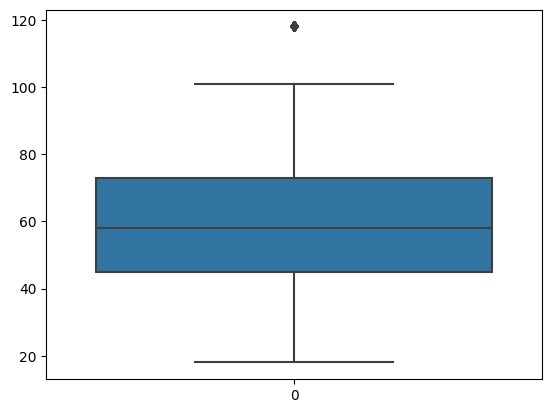

In [64]:
#using boxplot to check for outliers
sns.boxplot(profile_df.age)

In [65]:
profile_df.age.describe()

count    17000.000000
mean        62.531412
std         26.738580
min         18.000000
25%         45.000000
50%         58.000000
75%         73.000000
max        118.000000
Name: age, dtype: float64

<Axes: xlabel='age'>

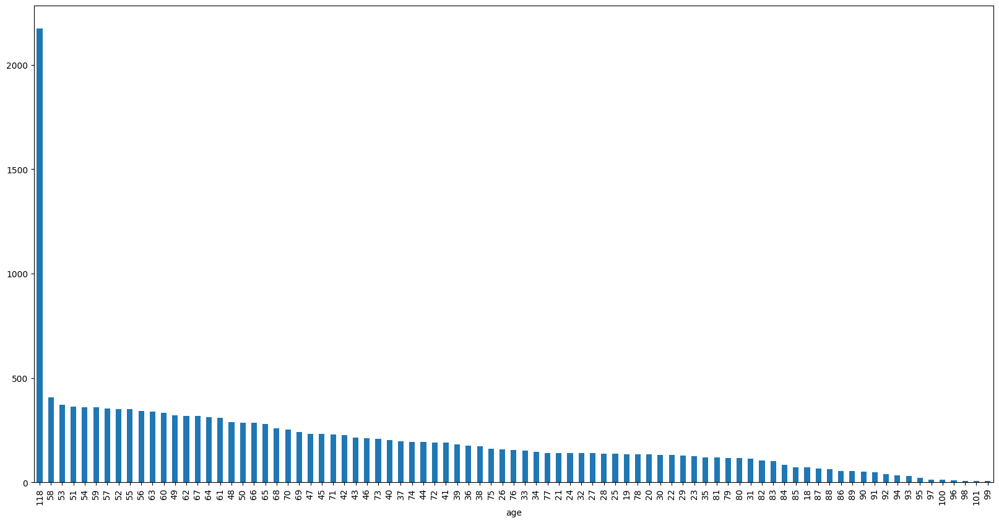

In [66]:
profile_df.age.value_counts().plot(kind='bar',figsize=(20,10))

In [67]:
profile_df.age.isna().sum()

0

In [68]:
profile_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17000 entries, 0 to 16999
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            14825 non-null  object 
 1   age               17000 non-null  int64  
 2   customer_id       17000 non-null  object 
 3   became_member_on  17000 non-null  float64
 4   income            14825 non-null  float64
 5   year              17000 non-null  int32  
 6   month             17000 non-null  int32  
 7   day               17000 non-null  int32  
dtypes: float64(2), int32(3), int64(1), object(2)
memory usage: 863.4+ KB


In [69]:
gender_stat = profile_df['gender'].value_counts().reset_index()

# Rename the columns for clarity
gender_stat.columns = ['Gender', 'Count']

# Create a bar chart using Plotly Express
fig = px.bar(gender_stat, x='Gender', y='Count', title='Gender Distribution', color='Gender')

# Show the plot
fig.show()

In [70]:
profile_df.gender.isna().sum()  

2175

#### I see that there are 2175 customers with age 118 & there have missing gender so I will ignore them. This is not possible. So I will replace these values with NaN.


In [71]:
#see if the indecies missing gender have age 118
# Assuming profile_df is your DataFrame
missing_gender_age_118 = profile_df[(profile_df['gender'].isnull()) & (profile_df['age'] == 118)]

# Display the resulting DataFrame
len(missing_gender_age_118)

2175

In [72]:
#drop age 118 records
profile_df.drop(profile_df[profile_df['age'] == 118].index, inplace = True)


In [73]:
#use boxplot to check for outliers
profile_df.shape

(14825, 8)

In [74]:
profile_df.income.describe()

count     14825.000000
mean      65404.991568
std       21598.299410
min       30000.000000
25%       49000.000000
50%       64000.000000
75%       80000.000000
max      120000.000000
Name: income, dtype: float64

<Axes: >

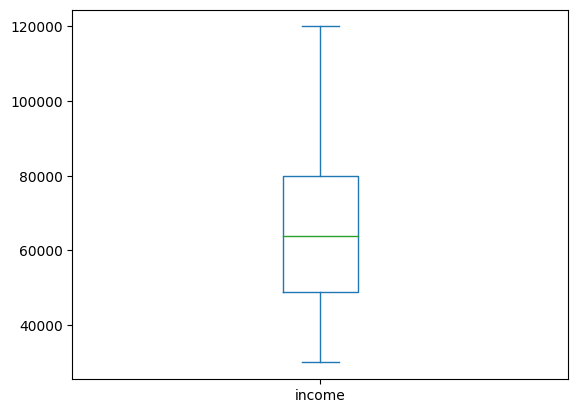

In [75]:
#outliers detection
profile_df.income.plot(kind='box')

In [76]:
profile_df['income'].isnull().sum()

0

In [77]:
### I make sure that the nan values in the same rows in columns age and income

In [78]:
# # I need to fill the missing values in the 'income' column with the KNN imputer 
# from sklearn.impute import KNNImputer
# imputer = KNNImputer(n_neighbors=5)
# profile_df['income'] = imputer.fit_transform(profile_df[['income']])
# profile_df['income'].isnull().sum()

(<Axes: title={'center': 'Income destribution'}, xlabel='Income', ylabel='Count'>,
 Text(0.5, 1.0, 'Income destribution'),
 Text(0.5, 0, 'Income'),
 Text(0, 0.5, 'Count'))

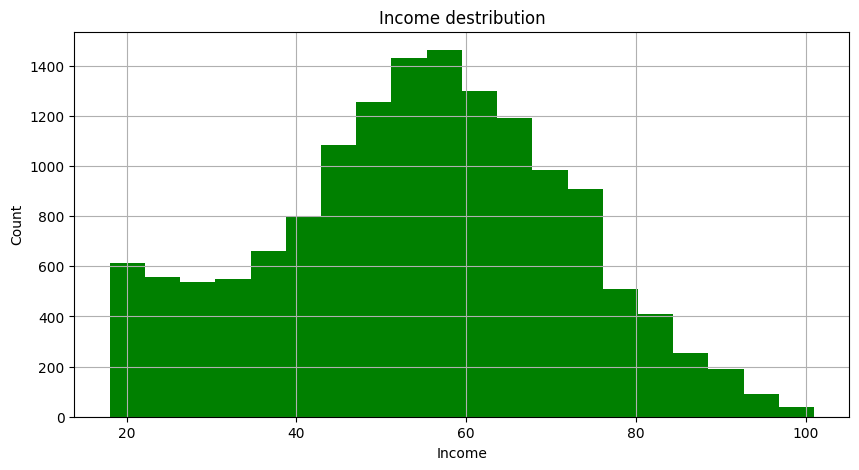

In [79]:
profile_df.age.hist(bins=20,figsize=(10,5),color='green'),plt.title('Income destribution'),plt.xlabel('Income'),plt.ylabel('Count')

(<Axes: title={'center': 'Income destribution'}, xlabel='Income', ylabel='Count'>,
 Text(0.5, 1.0, 'Income destribution'),
 Text(0.5, 0, 'Income'),
 Text(0, 0.5, 'Count'))

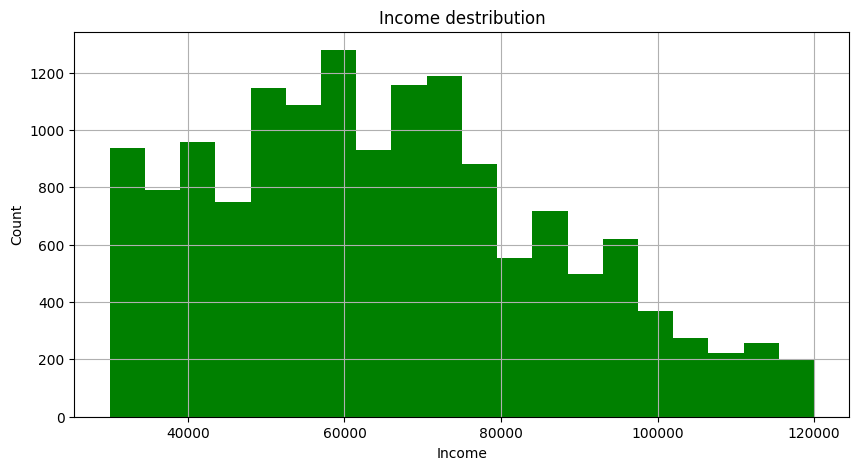

In [80]:
#I need a histogram with destiney of income
profile_df.income.hist(bins=20,figsize=(10,5),color='green'),plt.title('Income destribution'),plt.xlabel('Income'),plt.ylabel('Count')

<Axes: xlabel='year'>

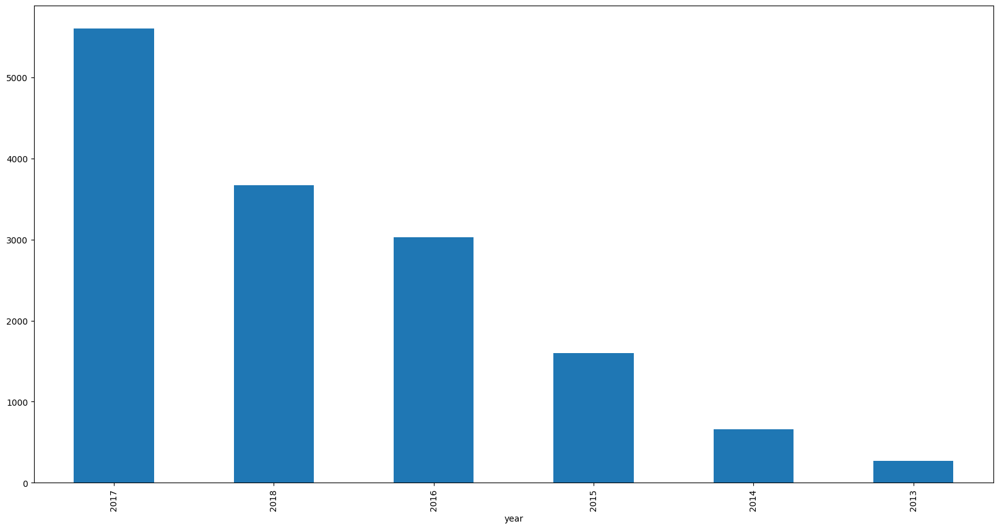

In [81]:
# see the distribution of year 
profile_df.year.value_counts().plot(kind='bar',figsize=(20,10))

#### from graph above we see that memberships increase year after year 

### Transcript dataset cleaning


**transcript Dataframe Tasks:**
- Fix the date
- Change the column name person to customer_id.
- rename value/offer id to offer_id 



In [82]:
transcript_df.shape

(59980, 7)

In [83]:
transcript_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59980 entries, 0 to 59979
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   person          59980 non-null  object 
 1   event           59980 non-null  object 
 2   value/offer id  38881 non-null  object 
 3   time            59980 non-null  int64  
 4   value/amount    16923 non-null  float64
 5   value/offer_id  4176 non-null   object 
 6   value/reward    4176 non-null   float64
dtypes: float64(2), int64(1), object(4)
memory usage: 3.2+ MB


In [84]:
transcript_df.describe()

,time,value/amount,value/reward
count,59980.000000,16923.000000,4176.000000
mean,17.428610,12.721589,5.072079
std,25.467678,29.764303,2.991937
min,0.000000,0.050000,2.000000
25%,0.000000,2.860000,2.000000
50%,0.000000,9.050000,5.000000
75%,30.000000,17.960000,5.000000
max,90.000000,962.100000,10.000000


In [85]:
transcript_df.describe(include='object')

,person,event,value/offer id,value/offer_id
count,59980,59980,38881,4176
unique,14173,4,10,8
top,a95c94e9e8444d3ea4e10d2b96c6bba4,offer received,fafdcd668e3743c1bb461111dcafc2a4,f19421c1d4aa40978ebb69ca19b0e20d
freq,15,25300,4555,703


#### I notice that the column 'value' has a dictionary inside it, so I will extract the values from it and put them in new columns and I notice that value/offer id have 10 unique values= no. of offers, so I will rename it to offer_id

In [86]:
#change the column name from 'person' to 'customer_id'
transcript_df.rename(columns={'person':'customer_id'},inplace=True)

In [87]:
len(transcript_df.customer_id.unique())

14173

it sound that not all data of customer are exist because I have 17000 customer in profile dataset and 14173 customer in transcript dataset

In [88]:
event_counts = transcript_df['event'].value_counts().reset_index()
event_counts.columns = ['Event', 'Count']

# Create a bar chart using Plotly Express
fig = px.bar(event_counts, x='Event', y='Count', title='Event Distribution',
             labels={'Event': 'Event Type', 'Count': 'Frequency'},color='Event')

# Show the plot
fig.show()

In [89]:
#make new columns for each event type
event_df = pd.get_dummies(transcript_df['event'])
transcript_df = pd.concat([transcript_df, event_df], axis=1)
#drop the event column
# transcript_df.drop(columns='event', inplace=True)

In [90]:
#convert new event columns to integer
transcript_df[event_df.columns] = transcript_df[event_df.columns].astype(int)

In [91]:
transcript_df.head()

,customer_id,event,value/offer id,time,value/amount,value/offer_id,value/reward,offer completed,offer received,offer viewed,transaction
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,9b98b8c7a33c4b65b9aebfe6a799e6d9,0,NaN,NaN,NaN,0,1,0,0
1,a03223e636434f42ac4c3df47e8bac43,offer received,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,NaN,NaN,NaN,0,1,0,0
2,e2127556f4f64592b11af22de27a7932,offer received,2906b810c7d4411798c6938adc9daaa5,0,NaN,NaN,NaN,0,1,0,0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,fafdcd668e3743c1bb461111dcafc2a4,0,NaN,NaN,NaN,0,1,0,0
4,68617ca6246f4fbc85e91a2a49552598,offer received,4d5c57ea9a6940dd891ad53e9dbe8da0,0,NaN,NaN,NaN,0,1,0,0


In [92]:
transcript_df["value/offer id"].isna().sum()

21099

In [93]:
transcript_df['value/offer id'].value_counts()

value/offer id
fafdcd668e3743c1bb461111dcafc2a4    4555
f19421c1d4aa40978ebb69ca19b0e20d    4391
2298d6c36e964ae4a3e7e9706d1fb8c2    4229
4d5c57ea9a6940dd891ad53e9dbe8da0    4184
ae264e3637204a6fb9bb56bc8210ddfd    4154
5a8bc65990b245e5a138643cd4eb9837    4086
3f207df678b143eea3cee63160fa8bed    3454
2906b810c7d4411798c6938adc9daaa5    3395
9b98b8c7a33c4b65b9aebfe6a799e6d9    3338
0b1e1539f2cc45b7b9fa7c272da2e1d7    3095
Name: count, dtype: int64

In [94]:
transcript_df['value/amount'].value_counts()

value/amount
0.05     49
1.18     30
0.60     26
1.44     26
1.22     26
         ..
31.26     1
30.53     1
32.64     1
29.78     1
33.39     1
Name: count, Length: 3383, dtype: int64

In [95]:
transcript_df['value/amount'].isna().sum()

43057

In [96]:
#get the amount from the value column by renaming it to amount
transcript_df.rename(columns={'value/amount':'amount'},inplace=True)

In [97]:
#index of rows with amount = nan see the event status
missing_amount_events = transcript_df[transcript_df['amount'].isnull()]['event'].unique()
print(missing_amount_events)


['offer received' 'offer viewed' 'offer completed']


### it's abovious that the missing amount having no transaction event. So, I will fill the missing values with zero 

In [98]:
# filling the nan values of amount column with 0
transcript_df['amount'].fillna(0, inplace=True)

In [99]:
transcript_df['value/reward'].value_counts()

value/reward
5.0     1410
2.0     1104
10.0     991
3.0      671
Name: count, dtype: int64

In [100]:
transcript_df['value/reward'].isna().sum()

55804

In [101]:
missing_reward_events = transcript_df[transcript_df['value/reward'].isnull()]['event'].unique()
print(missing_reward_events)


['offer received' 'offer viewed' 'transaction']


In [102]:
transcript_df['value/offer_id'].value_counts()

value/offer_id
f19421c1d4aa40978ebb69ca19b0e20d    703
2298d6c36e964ae4a3e7e9706d1fb8c2    671
fafdcd668e3743c1bb461111dcafc2a4    667
4d5c57ea9a6940dd891ad53e9dbe8da0    527
9b98b8c7a33c4b65b9aebfe6a799e6d9    501
ae264e3637204a6fb9bb56bc8210ddfd    464
2906b810c7d4411798c6938adc9daaa5    437
0b1e1539f2cc45b7b9fa7c272da2e1d7    206
Name: count, dtype: int64

In [103]:
#rename the value/reward id column to reward
transcript_df.rename(columns={'value/reward':'reward'},inplace=True)

In [104]:
transcript_df.shape

(59980, 11)

In [105]:
transcript_df.isna().sum().sort_values(ascending=False)/len(transcript_df)*100

value/offer_id     93.037679
reward             93.037679
value/offer id     35.176726
customer_id         0.000000
event               0.000000
time                0.000000
amount              0.000000
offer completed     0.000000
offer received      0.000000
offer viewed        0.000000
transaction         0.000000
dtype: float64

we see that missing values in columns value/offer_id and value/reward > 70 % and that will mislead us so we will drop them


In [106]:
#rename value/offer id to offer_id
transcript_df.rename(columns={'value/offer id':'offer_id'},inplace=True)

In [107]:
#drop the value/offer_id, value/amount and value/reward coulmns as they are not required
transcript_df.drop(columns=['value/offer_id','reward'],inplace=True)

In [108]:
transcript_df.isna().sum().sort_values(ascending=False)/len(transcript_df)*100

offer_id           35.176726
customer_id         0.000000
event               0.000000
time                0.000000
amount              0.000000
offer completed     0.000000
offer received      0.000000
offer viewed        0.000000
transaction         0.000000
dtype: float64

In [109]:
transcript_df.amount.value_counts()

amount
0.00     43057
0.05        49
1.18        30
1.22        26
0.60        26
         ...  
31.26        1
30.53        1
32.64        1
29.78        1
33.39        1
Name: count, Length: 3384, dtype: int64

In [110]:
#group by customer_id and offer_id 
transcript_df.groupby(['customer_id', 'offer_id']).count()


,,event,time,amount,offer completed,offer received,offer viewed,transaction
customer_id,offer_id,,,,,,,
0011e0d4e6b944f998e987f904e8c1e5,3f207df678b143eea3cee63160fa8bed,4,4,4,4,4,4,4
0020c2b971eb4e9188eac86d93036a77,fafdcd668e3743c1bb461111dcafc2a4,4,4,4,4,4,4,4
003d66b6608740288d6cc97a6903f4f0,5a8bc65990b245e5a138643cd4eb9837,3,3,3,3,3,3,3
00426fe3ffde4c6b9cb9ad6d077a13ea,5a8bc65990b245e5a138643cd4eb9837,3,3,3,3,3,3,3
005500a7188546ff8a767329a2f7c76a,ae264e3637204a6fb9bb56bc8210ddfd,3,3,3,3,3,3,3
...,...,...,...,...,...,...,...,...
fff29fb549084123bd046dbc5ceb4faa,ae264e3637204a6fb9bb56bc8210ddfd,2,2,2,2,2,2,2
fff3ba4757bd42088c044ca26d73817a,fafdcd668e3743c1bb461111dcafc2a4,4,4,4,4,4,4,4
fff7576017104bcc8677a8d63322b5e1,fafdcd668e3743c1bb461111dcafc2a4,3,3,3,3,3,3,3


In [111]:
#show how many offers each customer completed after viewed
completed_offers = transcript_df[(transcript_df['offer completed'] == 1) & (transcript_df['offer viewed'] == 1)]
customer_ids = completed_offers['customer_id'].unique()
print("the total number of customer who completed offer after viewed is ",len(customer_ids))


the total number of customer who completed offer after viewed is  0


In [112]:
#show how many offers each customer received
offers_received = transcript_df[(transcript_df['offer received'] == 1)]
len(offers_received)


25300

In [113]:
# how many offers each customer make a transaction
transcript_df[(transcript_df['transaction'] == 1)]['customer_id'].value_counts().shape

(8476,)

In [114]:
#show how many offers each customer completed
transcript_df[(transcript_df['offer completed'] == 1)]['customer_id'].value_counts().shape

(3453,)

In [115]:
transcript_df['customer_id'].value_counts()

customer_id
a95c94e9e8444d3ea4e10d2b96c6bba4    15
26de843918834f53b73844559b4b90f2    15
e67ada5fe1e240879e7a104257b196f8    15
f3cd5ab3f77e491a91d854e3f04d04c3    15
e4087b3f387b47e38d58e920f779056b    15
                                    ..
c4556c7bb4ab4c9d8e5fbf15c450b2b8     1
de2fdfba151e4fa6a940412e771316c4     1
537d1682c42740218162e3bca53b9552     1
49589dc19aec449f813a3486fc004af3     1
6af556ad6e3a4046b8eec8156295d9e9     1
Name: count, Length: 14173, dtype: int64

In [116]:
customer_events = transcript_df[transcript_df['customer_id'] == "a95c94e9e8444d3ea4e10d2b96c6bba4"]
customer_events.head()

,customer_id,event,offer_id,time,amount,offer completed,offer received,offer viewed,transaction
7980,a95c94e9e8444d3ea4e10d2b96c6bba4,offer received,ae264e3637204a6fb9bb56bc8210ddfd,0,0.00,0,1,0,0
14471,a95c94e9e8444d3ea4e10d2b96c6bba4,transaction,NaN,0,2.29,0,0,0,1
17192,a95c94e9e8444d3ea4e10d2b96c6bba4,offer viewed,ae264e3637204a6fb9bb56bc8210ddfd,6,0.00,0,0,1,0
17193,a95c94e9e8444d3ea4e10d2b96c6bba4,transaction,NaN,6,1.52,0,0,0,1
19500,a95c94e9e8444d3ea4e10d2b96c6bba4,transaction,NaN,12,4.15,0,0,0,1


there is offer id for transaction event

In [117]:
customer_events = transcript_df[transcript_df['customer_id'] == "a95c94e9e8444d3ea4e10d2b96c6bba4"]
grouped_events = customer_events.groupby('offer_id')
grouped_events.head()

,customer_id,event,offer_id,time,amount,offer completed,offer received,offer viewed,transaction
7980,a95c94e9e8444d3ea4e10d2b96c6bba4,offer received,ae264e3637204a6fb9bb56bc8210ddfd,0,0.0,0,1,0,0
17192,a95c94e9e8444d3ea4e10d2b96c6bba4,offer viewed,ae264e3637204a6fb9bb56bc8210ddfd,6,0.0,0,0,1,0
27977,a95c94e9e8444d3ea4e10d2b96c6bba4,offer received,ae264e3637204a6fb9bb56bc8210ddfd,0,0.0,0,1,0,0
37189,a95c94e9e8444d3ea4e10d2b96c6bba4,offer viewed,ae264e3637204a6fb9bb56bc8210ddfd,6,0.0,0,0,1,0


In [118]:
#show offer_id for each event "tranasction" for each customer
transcript_df[transcript_df['transaction'] == 1]['offer_id'].unique()

array([nan], dtype=object)

it sounds that each customer make tranaction hasn't offer_id

In [119]:
completed_offers = transcript_df[transcript_df['offer completed'] == 1]
offer_ids = completed_offers['offer_id'].unique()
print(offer_ids)


[nan]


it seems that there is an offer id for completed offer event like transaction event

In [120]:
#show how many offers each customer completed and make a transaction
completed_offers = transcript_df[(transcript_df['offer completed'] == 1) & (transcript_df['transaction'] == 1)]
customer_ids = completed_offers['customer_id'].unique()
print("the total number of customer who pay offer after complete is ",len(customer_ids))


the total number of customer who pay offer after complete is  0


In [121]:
#show how many offers each customer recieve and make a transaction
completed_offers = transcript_df[(transcript_df['offer received'] == 1) & (transcript_df['transaction'] == 1)]
customer_ids = completed_offers['customer_id'].unique()
print("the total number of customer who pay offer after complete is ",len(customer_ids))


the total number of customer who pay offer after complete is  0


In [122]:
completed_offers = transcript_df[(transcript_df['offer completed'] == 1)]
len(completed_offers)


4176

In [123]:
bb = transcript_df.groupby(['customer_id', 'offer_id', 'event']).size()
bb.head(20)


customer_id                       offer_id                          event         
0011e0d4e6b944f998e987f904e8c1e5  3f207df678b143eea3cee63160fa8bed  offer received    2
                                                                    offer viewed      2
0020c2b971eb4e9188eac86d93036a77  fafdcd668e3743c1bb461111dcafc2a4  offer received    2
                                                                    offer viewed      2
003d66b6608740288d6cc97a6903f4f0  5a8bc65990b245e5a138643cd4eb9837  offer received    2
                                                                    offer viewed      1
00426fe3ffde4c6b9cb9ad6d077a13ea  5a8bc65990b245e5a138643cd4eb9837  offer received    2
                                                                    offer viewed      1
005500a7188546ff8a767329a2f7c76a  ae264e3637204a6fb9bb56bc8210ddfd  offer received    2
                                                                    offer viewed      1
0056df74b63b4298809f0b375a304cf4  9b9

I will try to group by customer id and if customer id have transaction and offer completed then it is successful offer


I notice that each customer have make only one offer

In [124]:
#show how many offers each customer completed and make a transaction
transcript_df[(transcript_df['transaction'] == 1)]['customer_id'].value_counts().shape

(8476,)

In [125]:
customer_group = transcript_df.groupby(['customer_id', 'event']).size()
customer_group.head(20)
len(customer_group)


33706

In [126]:
len(transcript_df.customer_id.unique())

14173

In [127]:
offer_counts = transcript_df.groupby('customer_id').agg({'offer received': 'sum', 'offer viewed': 'sum', 'transaction': 'sum', 'offer completed': 'sum'})
offer_counts.head()


,offer received,offer viewed,transaction,offer completed
customer_id,,,,
0011e0d4e6b944f998e987f904e8c1e5,2,2,0,0
0020c2b971eb4e9188eac86d93036a77,2,2,3,1
0020ccbbb6d84e358d3414a3ff76cffd,0,0,1,0
003d66b6608740288d6cc97a6903f4f0,2,1,2,0
00426fe3ffde4c6b9cb9ad6d077a13ea,2,1,6,0


In [128]:
#show how many offers each customer completed and make a Viewed
customer_counts = transcript_df.groupby('customer_id').agg({'offer viewed': 'sum', 'offer completed': 'sum'})
equal_counts = customer_counts[customer_counts['offer viewed'] == customer_counts['offer completed']]
num_customers = len(equal_counts)
print("Number of customers where completed offers equal viewed offers:", num_customers)


Number of customers where completed offers equal viewed offers: 6333


In [129]:
customer_offer_counts = transcript_df.groupby('customer_id')['offer_id'].nunique()
customer_offer_counts.shape
customer_offer_counts.unique()

array([1, 0])

I make sure that each customer have dealt with only an offer

In [130]:
transcript_df.offer_id.isna().sum()

21099

### I will make an assumption that missing offer_id is the offer_id of the same customer_id 

In [131]:
transcript_df.to_csv('transcript cleaned.csv',index=False)

In [132]:
customer_events = transcript_df[transcript_df['customer_id'] == "a95c94e9e8444d3ea4e10d2b96c6bba4"]
customer_events.head()

,customer_id,event,offer_id,time,amount,offer completed,offer received,offer viewed,transaction
7980,a95c94e9e8444d3ea4e10d2b96c6bba4,offer received,ae264e3637204a6fb9bb56bc8210ddfd,0,0.00,0,1,0,0
14471,a95c94e9e8444d3ea4e10d2b96c6bba4,transaction,NaN,0,2.29,0,0,0,1
17192,a95c94e9e8444d3ea4e10d2b96c6bba4,offer viewed,ae264e3637204a6fb9bb56bc8210ddfd,6,0.00,0,0,1,0
17193,a95c94e9e8444d3ea4e10d2b96c6bba4,transaction,NaN,6,1.52,0,0,0,1
19500,a95c94e9e8444d3ea4e10d2b96c6bba4,transaction,NaN,12,4.15,0,0,0,1


In [133]:
#dealling with missing values in offer_id column
transcript_df['offer_id'] = transcript_df.groupby('customer_id')['offer_id'].fillna(method='ffill')


In [134]:
customer_events = transcript_df[transcript_df['customer_id'] == "a95c94e9e8444d3ea4e10d2b96c6bba4"]
customer_events.head()

,customer_id,event,offer_id,time,amount,offer completed,offer received,offer viewed,transaction
7980,a95c94e9e8444d3ea4e10d2b96c6bba4,offer received,ae264e3637204a6fb9bb56bc8210ddfd,0,0.00,0,1,0,0
14471,a95c94e9e8444d3ea4e10d2b96c6bba4,transaction,ae264e3637204a6fb9bb56bc8210ddfd,0,2.29,0,0,0,1
17192,a95c94e9e8444d3ea4e10d2b96c6bba4,offer viewed,ae264e3637204a6fb9bb56bc8210ddfd,6,0.00,0,0,1,0
17193,a95c94e9e8444d3ea4e10d2b96c6bba4,transaction,ae264e3637204a6fb9bb56bc8210ddfd,6,1.52,0,0,0,1
19500,a95c94e9e8444d3ea4e10d2b96c6bba4,transaction,ae264e3637204a6fb9bb56bc8210ddfd,12,4.15,0,0,0,1


In [135]:
cc = transcript_df.groupby(['customer_id', 'offer_id', 'event']).size()
cc.head(20)


customer_id                       offer_id                          event          
0011e0d4e6b944f998e987f904e8c1e5  3f207df678b143eea3cee63160fa8bed  offer received     2
                                                                    offer viewed       2
0020c2b971eb4e9188eac86d93036a77  fafdcd668e3743c1bb461111dcafc2a4  offer completed    1
                                                                    offer received     2
                                                                    offer viewed       2
                                                                    transaction        3
003d66b6608740288d6cc97a6903f4f0  5a8bc65990b245e5a138643cd4eb9837  offer received     2
                                                                    offer viewed       1
                                                                    transaction        2
00426fe3ffde4c6b9cb9ad6d077a13ea  5a8bc65990b245e5a138643cd4eb9837  offer received     2
                          

# Merging all the datasets
### merge portfolio, profile and transcript datasets

In [136]:
transcript_df.head()


,customer_id,event,offer_id,time,amount,offer completed,offer received,offer viewed,transaction
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,9b98b8c7a33c4b65b9aebfe6a799e6d9,0,0.0,0,1,0,0
1,a03223e636434f42ac4c3df47e8bac43,offer received,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,0.0,0,1,0,0
2,e2127556f4f64592b11af22de27a7932,offer received,2906b810c7d4411798c6938adc9daaa5,0,0.0,0,1,0,0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,fafdcd668e3743c1bb461111dcafc2a4,0,0.0,0,1,0,0
4,68617ca6246f4fbc85e91a2a49552598,offer received,4d5c57ea9a6940dd891ad53e9dbe8da0,0,0.0,0,1,0,0


In [137]:
portfolio_df.head()

,reward,difficulty,duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,bogo,discount,informational
0,10,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0,1,0,0
1,10,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1,1,0,0
2,0,0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1,0,0,1
3,5,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1,1,0,0
4,5,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1,0,1,0


In [138]:
profile_df.head()

,gender,age,customer_id,became_member_on,income,year,month,day
1,F,55,0610b486422d4921ae7d2bf64640c50b,2359.0,112000.0,2017,7,15
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,2426.0,100000.0,2017,5,9
5,M,68,e2127556f4f64592b11af22de27a7932,2074.0,70000.0,2018,4,26
8,M,65,389bc3fa690240e798340f5a15918d5c,2150.0,53000.0,2018,2,9
12,M,58,2eeac8d8feae4a8cad5a6af0499a211d,2240.0,51000.0,2017,11,11


In [139]:
# for loop to see the missing values in each feature through the dataframes
for df in [portfolio_df, profile_df, transcript_df]:
    print(df.isnull().sum().sort_values(ascending=False)/len(df)*100)
    print('\n')

reward            0.0
difficulty        0.0
duration          0.0
offer_type        0.0
offer_id          0.0
channel_email     0.0
channel_mobile    0.0
channel_social    0.0
channel_web       0.0
bogo              0.0
discount          0.0
informational     0.0
dtype: float64


gender              0.0
age                 0.0
customer_id         0.0
became_member_on    0.0
income              0.0
year                0.0
month               0.0
day                 0.0
dtype: float64


offer_id           3.716239
customer_id        0.000000
event              0.000000
time               0.000000
amount             0.000000
offer completed    0.000000
offer received     0.000000
offer viewed       0.000000
transaction        0.000000
dtype: float64




#### checking the outliers in the dataset then checking datatype of each column

In [140]:
portfolio_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   reward          10 non-null     int64 
 1   difficulty      10 non-null     int64 
 2   duration        10 non-null     int64 
 3   offer_type      10 non-null     object
 4   offer_id        10 non-null     object
 5   channel_email   10 non-null     int64 
 6   channel_mobile  10 non-null     int64 
 7   channel_social  10 non-null     int64 
 8   channel_web     10 non-null     int64 
 9   bogo            10 non-null     int64 
 10  discount        10 non-null     int64 
 11  informational   10 non-null     int64 
dtypes: int64(10), object(2)
memory usage: 1.1+ KB


In [141]:
transcript_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59980 entries, 0 to 59979
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   customer_id      59980 non-null  object 
 1   event            59980 non-null  object 
 2   offer_id         57751 non-null  object 
 3   time             59980 non-null  int64  
 4   amount           59980 non-null  float64
 5   offer completed  59980 non-null  int64  
 6   offer received   59980 non-null  int64  
 7   offer viewed     59980 non-null  int64  
 8   transaction      59980 non-null  int64  
dtypes: float64(1), int64(5), object(3)
memory usage: 4.1+ MB


In [142]:
profile_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14825 entries, 1 to 16999
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            14825 non-null  object 
 1   age               14825 non-null  int64  
 2   customer_id       14825 non-null  object 
 3   became_member_on  14825 non-null  float64
 4   income            14825 non-null  float64
 5   year              14825 non-null  int32  
 6   month             14825 non-null  int32  
 7   day               14825 non-null  int32  
dtypes: float64(2), int32(3), int64(1), object(2)
memory usage: 868.7+ KB


In [143]:
merged_df = pd.merge(transcript_df, profile_df, on='customer_id', how='left')
merged_df = pd.merge(merged_df, portfolio_df, on='offer_id', how='left')

In [144]:
merged_df.head()

,customer_id,event,offer_id,time,amount,offer completed,offer received,offer viewed,transaction,gender,...,difficulty,duration,offer_type,channel_email,channel_mobile,channel_social,channel_web,bogo,discount,informational
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,9b98b8c7a33c4b65b9aebfe6a799e6d9,0,0.0,0,1,0,0,F,...,5.0,7.0,bogo,1.0,1.0,0.0,1.0,1.0,0.0,0.0
1,a03223e636434f42ac4c3df47e8bac43,offer received,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,0.0,0,1,0,0,NaN,...,20.0,10.0,discount,1.0,0.0,0.0,1.0,0.0,1.0,0.0
2,e2127556f4f64592b11af22de27a7932,offer received,2906b810c7d4411798c6938adc9daaa5,0,0.0,0,1,0,0,M,...,10.0,7.0,discount,1.0,1.0,0.0,1.0,0.0,1.0,0.0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,fafdcd668e3743c1bb461111dcafc2a4,0,0.0,0,1,0,0,NaN,...,10.0,10.0,discount,1.0,1.0,1.0,1.0,0.0,1.0,0.0
4,68617ca6246f4fbc85e91a2a49552598,offer received,4d5c57ea9a6940dd891ad53e9dbe8da0,0,0.0,0,1,0,0,NaN,...,10.0,5.0,bogo,1.0,1.0,1.0,1.0,1.0,0.0,0.0


In [145]:
merged_df.reward.value_counts()

reward
5.0     15988
10.0    12806
2.0     12285
0.0     10017
3.0      6655
Name: count, dtype: int64

In [146]:
merged_df.shape

(59980, 27)

In [147]:
merged_df.became_member_on.value_counts()

became_member_on
2324.0    158
2165.0    146
2214.0    138
2237.0    125
2181.0    120
         ... 
3349.0      1
3661.0      1
3751.0      1
3372.0      1
3531.0      1
Name: count, Length: 1676, dtype: int64

In [148]:
nan_percentage = merged_df.isna().sum() / len(merged_df) * 100
nan_percentage_sorted = nan_percentage.sort_values(ascending=False)
nan_percentage_sorted


year                11.647216
gender              11.647216
age                 11.647216
became_member_on    11.647216
income              11.647216
month               11.647216
day                 11.647216
difficulty           3.716239
discount             3.716239
bogo                 3.716239
channel_web          3.716239
channel_social       3.716239
channel_mobile       3.716239
channel_email        3.716239
offer_type           3.716239
duration             3.716239
informational        3.716239
reward               3.716239
offer_id             3.716239
event                0.000000
transaction          0.000000
offer viewed         0.000000
offer received       0.000000
offer completed      0.000000
amount               0.000000
time                 0.000000
customer_id          0.000000
dtype: float64

In [149]:
merged_df.offer_id.isna().sum()

2229

### this missing values in offer_id column have no offer_id because they are transactions

In [150]:
merged_df[['informational', 'reward', 'discount', 'bogo', 'channel_web', 'channel_social', 'channel_mobile', 'channel_email']] = merged_df[['informational', 'reward', 'discount', 'bogo', 'channel_web', 'channel_social', 'channel_mobile', 'channel_email']].fillna(0)

In [151]:
nan_percentage = merged_df.isna().sum() / len(merged_df) * 100
nan_percentage_sorted = nan_percentage.sort_values(ascending=False)
nan_percentage_sorted


year                11.647216
gender              11.647216
day                 11.647216
month               11.647216
income              11.647216
became_member_on    11.647216
age                 11.647216
offer_type           3.716239
duration             3.716239
difficulty           3.716239
offer_id             3.716239
channel_mobile       0.000000
channel_social       0.000000
channel_web          0.000000
bogo                 0.000000
discount             0.000000
channel_email        0.000000
customer_id          0.000000
reward               0.000000
event                0.000000
transaction          0.000000
offer viewed         0.000000
offer received       0.000000
offer completed      0.000000
amount               0.000000
time                 0.000000
informational        0.000000
dtype: float64

In [152]:
merged_df.gender.value_counts()

gender
M    29847
F    22315
O      832
Name: count, dtype: int64

It seems that the missing value have same percentage so I make an imply that the missing values have no offer do I will fill the missing in offer_id with No offer 
then fill the event columns with 0 as no offer was sent

In [153]:
#fill the missing values in offer_id with No Offer
merged_df.offer_id.fillna('No Offer', inplace=True)

In [154]:
#fill discount ,bogo and informational with 0
merged_df.discount.fillna(0, inplace=True)
merged_df.bogo.fillna(0, inplace=True)
merged_df.informational.fillna(0, inplace=True)

In [155]:
#fill missing Offer Completed, Offer Received, Offer Viewed with 0
merged_df['offer completed'].fillna(0, inplace=True)
merged_df['offer received'].fillna(0, inplace=True)
merged_df['offer viewed'].fillna(0, inplace=True)

In [156]:
# fill missing values in channels with 0
merged_df.channel_web.fillna(0, inplace=True)
merged_df.channel_social.fillna(0, inplace=True)
merged_df.channel_mobile.fillna(0, inplace=True)
merged_df.channel_email.fillna(0, inplace=True)

In [157]:
#fill missing values in reward , difficulty and duration            
merged_df.duration.fillna(0, inplace=True)
merged_df.reward.fillna(0, inplace=True)
merged_df.difficulty.fillna(0, inplace=True)


In [158]:
#fill the missing values in offer_type with No Offer
merged_df.offer_type.fillna('No Offer', inplace=True)

In [159]:
merged_df.shape

(59980, 27)

In [160]:
merged_df.customer_id.nunique() 

14173

In [161]:
from sklearn.impute import SimpleImputer

# Create the imputer with strategy 'most_frequent'
imputer = SimpleImputer(strategy='most_frequent')

# Fit and transform the 'gender' column
# The output will be a 2D array, so we take the first (and only) column of this array
merged_df['gender'] = imputer.fit_transform(merged_df[['gender']])[:, 0]

In [162]:
gender_encoded = pd.get_dummies(merged_df['gender'], prefix='gender')
merged_df = pd.concat([merged_df, gender_encoded], axis=1)


In [163]:
#drop gender column
# merged_df.drop(columns='gender', inplace=True)


In [164]:
# from sklearn.impute import KNNImputer

# imputer = KNNImputer(n_neighbors=5)
# merged_df['age'] = imputer.fit_transform(merged_df[['age']])


In [165]:
# merged_df.to_csv('merged_df.csv', index=False)

In [166]:
nan_percentage = merged_df.isna().sum() / len(merged_df) * 100
nan_percentage_sorted = nan_percentage.sort_values(ascending=False)
nan_percentage_sorted


day                 11.647216
month               11.647216
year                11.647216
income              11.647216
became_member_on    11.647216
age                 11.647216
channel_mobile       0.000000
channel_email        0.000000
channel_social       0.000000
duration             0.000000
channel_web          0.000000
bogo                 0.000000
discount             0.000000
informational        0.000000
gender_F             0.000000
gender_M             0.000000
offer_type           0.000000
customer_id          0.000000
difficulty           0.000000
reward               0.000000
event                0.000000
gender               0.000000
transaction          0.000000
offer viewed         0.000000
offer received       0.000000
offer completed      0.000000
amount               0.000000
time                 0.000000
offer_id             0.000000
gender_O             0.000000
dtype: float64

In [167]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
merged_df[['day', 'month', 'year']] = imputer.fit_transform(merged_df[['day', 'month', 'year']])


In [168]:
#filling missing value in age  and age interval with simple imputer
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='median')
merged_df['age'] = imputer.fit_transform(merged_df[['age']])
merged_df['age'] = merged_df['age'].astype(int)


In [169]:
# # Discretize age feature (segment and sort)
# merged_df['age_separation']=pd.cut(x=merged_df['age'], bins=[0,10,20,30,40,50,60,70,80,90,100,110])

# # Concat the new columns to profile dataset
# merged_df = pd.concat([merged_df, pd.get_dummies(merged_df['age_separation'], prefix='age')], axis=1)
# merged_df['age_(0, 10]'].isnull().sum()


# # # groupby age and gender
# # membership_age = profile_df.groupby(['age_separation', 'gender']).size()
# # membership_age = membership_age.reset_index()
# # membership_age.columns = ['age_separation', 'gender', 'count']



In [170]:
#filling missing value in income with simple imputer
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='median')
merged_df['income'] = imputer.fit_transform(merged_df[['income']])
merged_df['income'] = merged_df['income'].astype(int)


In [171]:
#filling missing value in becone_member_on with knn imputer
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
merged_df['became_member_on'] = imputer.fit_transform(merged_df[['became_member_on']])


In [172]:
# # Discretize age feature (segment and sort)
# merged_df['age_separation']=pd.cut(x=merged_df['age'], bins=[0,10,20,30,40,50,60,70,80,90,100,110])
# # Create dummy variables for the 'age_separation' feature
# dummy_age = pd.get_dummies(merged_df['age_separation'], prefix='age')

# # Convert column names to strings and modify them as needed
# dummy_age.columns = dummy_age.columns.astype(str).str.replace('(', '').str.replace(']', '').str.replace(',', '_to_').str.replace(' ', '_')

# # Concat the new columns to profile dataset
# merged_df = pd.concat([merged_df, pd.get_dummies(merged_df['age_separation'])], axis=1)
import pandas as pd

# Assuming your DataFrame is named 'merged_df'
merged_df['age_separation'] = pd.cut(x=merged_df['age'], bins=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110])

# Create dummy variables for the 'age_separation' feature
dummy_age = pd.get_dummies(merged_df['age_separation'], prefix='age')

# Convert column names to strings and modify them as needed
dummy_age.columns = dummy_age.columns.astype(str).str.replace('(', '').str.replace(']', '').str.replace(',', '_to_').str.replace(' ', '_')

# Concatenate the new columns to the original DataFrame
merged_df = pd.concat([merged_df, dummy_age], axis=1)

# Drop the original 'age_separation' column if needed
# merged_df = merged_df.drop('age_separation', axis=1)

# Display the modified DataFrame
print(merged_df.head())



                        customer_id           event  \
0  78afa995795e4d85b5d9ceeca43f5fef  offer received   
1  a03223e636434f42ac4c3df47e8bac43  offer received   
2  e2127556f4f64592b11af22de27a7932  offer received   
3  8ec6ce2a7e7949b1bf142def7d0e0586  offer received   
4  68617ca6246f4fbc85e91a2a49552598  offer received   

                           offer_id  time  amount  offer completed  \
0  9b98b8c7a33c4b65b9aebfe6a799e6d9     0     0.0                0   
1  0b1e1539f2cc45b7b9fa7c272da2e1d7     0     0.0                0   
2  2906b810c7d4411798c6938adc9daaa5     0     0.0                0   
3  fafdcd668e3743c1bb461111dcafc2a4     0     0.0                0   
4  4d5c57ea9a6940dd891ad53e9dbe8da0     0     0.0                0   

   offer received  offer viewed  transaction gender  ...  age_10_to__20  \
0               1             0            0      F  ...          False   
1               1             0            0      M  ...          False   
2               1      

In [173]:
# merged_df = merged_df.drop('age_separation', axis=1)

In [174]:
merged_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59980 entries, 0 to 59979
Data columns (total 42 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   customer_id       59980 non-null  object  
 1   event             59980 non-null  object  
 2   offer_id          59980 non-null  object  
 3   time              59980 non-null  int64   
 4   amount            59980 non-null  float64 
 5   offer completed   59980 non-null  int64   
 6   offer received    59980 non-null  int64   
 7   offer viewed      59980 non-null  int64   
 8   transaction       59980 non-null  int64   
 9   gender            59980 non-null  object  
 10  age               59980 non-null  int64   
 11  became_member_on  59980 non-null  float64 
 12  income            59980 non-null  int64   
 13  year              59980 non-null  float64 
 14  month             59980 non-null  float64 
 15  day               59980 non-null  float64 
 16  reward            5998

In [175]:
merged_df.head()

,customer_id,event,offer_id,time,amount,offer completed,offer received,offer viewed,transaction,gender,...,age_10_to__20,age_20_to__30,age_30_to__40,age_40_to__50,age_50_to__60,age_60_to__70,age_70_to__80,age_80_to__90,age_90_to__100,age_100_to__110
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,9b98b8c7a33c4b65b9aebfe6a799e6d9,0,0.0,0,1,0,0,F,...,False,False,False,False,False,False,True,False,False,False
1,a03223e636434f42ac4c3df47e8bac43,offer received,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,0.0,0,1,0,0,M,...,False,False,False,False,True,False,False,False,False,False
2,e2127556f4f64592b11af22de27a7932,offer received,2906b810c7d4411798c6938adc9daaa5,0,0.0,0,1,0,0,M,...,False,False,False,False,False,True,False,False,False,False
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,fafdcd668e3743c1bb461111dcafc2a4,0,0.0,0,1,0,0,M,...,False,False,False,False,True,False,False,False,False,False
4,68617ca6246f4fbc85e91a2a49552598,offer received,4d5c57ea9a6940dd891ad53e9dbe8da0,0,0.0,0,1,0,0,M,...,False,False,False,False,True,False,False,False,False,False


In [176]:
merged_df['age_10_to__20'].isnull().sum()

0

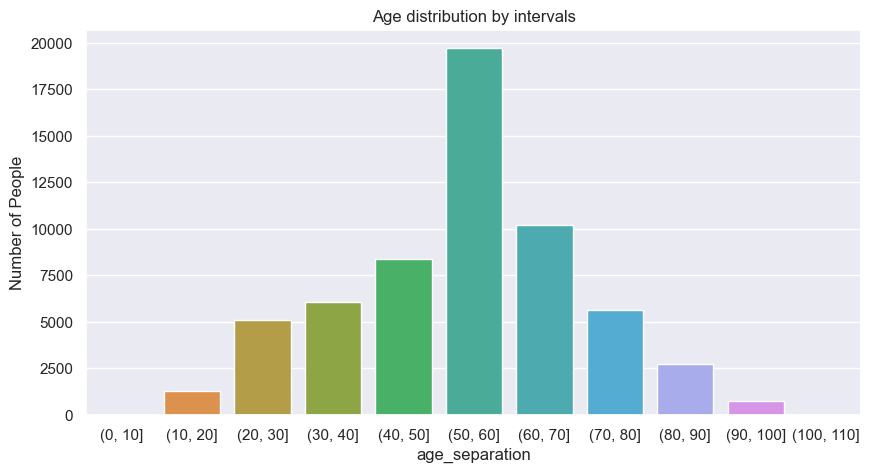

In [177]:
# Show age distribution
ax = plt.figure(figsize=(10,5))
sns.set(font_scale = 1)
ax = sns.countplot(x='age_separation', data=merged_df).set_title('Age distribution by intervals')
ax = plt.ylabel('Number of People')

As you can see, 50-60 interval age is the most frequent in the age distribution of Starbucks members. Mean age is exactly 54,39 years old.


In [178]:
# groupby age and gender
membership_age = merged_df.groupby(['age_separation', 'gender']).size()
membership_age = membership_age.reset_index()
membership_age.columns = ['age_separation', 'gender', 'count']

Text(0, 0.5, 'Number of members')

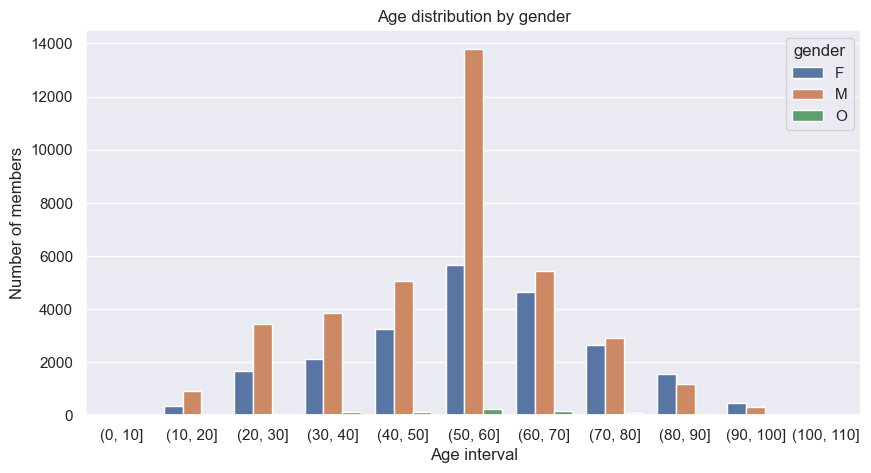

In [179]:
# plot a barplot for age distribution as a function of gender in membership program
plt.figure(figsize=(10, 5))
sns.barplot(x='age_separation', y='count', hue='gender', data=membership_age).set_title('Age distribution by gender')
plt.xlabel('Age interval')
plt.ylabel('Number of members')

In [180]:
nan_percentage = merged_df.isna().sum() / len(merged_df) * 100
nan_percentage_sorted = nan_percentage.sort_values(ascending=False)
nan_percentage_sorted


customer_id         0.0
age_0_to__10        0.0
channel_web         0.0
bogo                0.0
discount            0.0
informational       0.0
gender_F            0.0
gender_M            0.0
gender_O            0.0
age_separation      0.0
age_10_to__20       0.0
event               0.0
age_20_to__30       0.0
age_30_to__40       0.0
age_40_to__50       0.0
age_50_to__60       0.0
age_60_to__70       0.0
age_70_to__80       0.0
age_80_to__90       0.0
age_90_to__100      0.0
channel_social      0.0
channel_mobile      0.0
channel_email       0.0
offer_type          0.0
offer_id            0.0
time                0.0
amount              0.0
offer completed     0.0
offer received      0.0
offer viewed        0.0
transaction         0.0
gender              0.0
age                 0.0
became_member_on    0.0
income              0.0
year                0.0
month               0.0
day                 0.0
reward              0.0
difficulty          0.0
duration            0.0
age_100_to__110 

In [181]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59980 entries, 0 to 59979
Data columns (total 42 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   customer_id       59980 non-null  object  
 1   event             59980 non-null  object  
 2   offer_id          59980 non-null  object  
 3   time              59980 non-null  int64   
 4   amount            59980 non-null  float64 
 5   offer completed   59980 non-null  int64   
 6   offer received    59980 non-null  int64   
 7   offer viewed      59980 non-null  int64   
 8   transaction       59980 non-null  int64   
 9   gender            59980 non-null  object  
 10  age               59980 non-null  int64   
 11  became_member_on  59980 non-null  float64 
 12  income            59980 non-null  int64   
 13  year              59980 non-null  float64 
 14  month             59980 non-null  float64 
 15  day               59980 non-null  float64 
 16  reward            5998

In [182]:
#distribution of offer event status
offer_event_counts = merged_df[['offer completed', 'offer received', 'offer viewed','transaction']].sum().reset_index()
offer_event_counts.columns = ['Event', 'Count']
offer_event_counts['Event'] = offer_event_counts['Event'].str.replace('_', ' ').str.title()
px.bar(offer_event_counts, x='Event', y='Count', title='Offer Event Distribution',color='Event')

In [183]:
# #distribution of offer recieved and not transaction
# offer_received = merged_df[merged_df['offer received'] == 1]
# offer_not_transaction = offer_received[offer_received['transaction'] == 0]
# offer_not_transaction = offer_not_transaction[['offer_id', 'customer_id']].groupby('offer_id').count().reset_index()
# offer_not_transaction.columns = ['offer_id', 'count']
# offer_not_transaction = offer_not_transaction.sort_values(by='count', ascending=False)
# offer_not_transaction

In [184]:
# merged_df['income_segment'] = pd.qcut(merged_df['income'], q=4, labels=['Low', 'Medium', 'High', 'Very High'])
# merged_df['amount'] = merged_df.groupby('income_segment')['amount'].transform(lambda x: x.fillna(x.median()))


In [185]:
# # Fill missing values in 'difficulty' and 'duration' with the median of each column
# merged_df['difficulty'].fillna(merged_df['difficulty'].median(), inplace=True)
# merged_df['duration'].fillna(merged_df['duration'].median(), inplace=True)

### maping the offer_id to the offer type to simpilfy the analysis

In [186]:
portfolio_df.head(10)

,reward,difficulty,duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,bogo,discount,informational
0,10,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0,1,0,0
1,10,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1,1,0,0
2,0,0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1,0,0,1
3,5,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1,1,0,0
4,5,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1,0,1,0
5,3,7,7,discount,2298d6c36e964ae4a3e7e9706d1fb8c2,1,1,1,1,0,1,0
6,2,10,10,discount,fafdcd668e3743c1bb461111dcafc2a4,1,1,1,1,0,1,0
7,0,0,3,informational,5a8bc65990b245e5a138643cd4eb9837,1,1,1,0,0,0,1
8,5,5,5,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1,1,1,1,1,0,0
9,2,10,7,discount,2906b810c7d4411798c6938adc9daaa5,1,1,0,1,0,1,0


In [187]:
offer_id = {'ae264e3637204a6fb9bb56bc8210ddfd': 'BOGO1',
            '4d5c57ea9a6940dd891ad53e9dbe8da0': 'BOGO2',
            '9b98b8c7a33c4b65b9aebfe6a799e6d9': 'BOGO3',
            'f19421c1d4aa40978ebb69ca19b0e20d': 'BOGO4',
            '0b1e1539f2cc45b7b9fa7c272da2e1d7': 'Discount1',
            '2298d6c36e964ae4a3e7e9706d1fb8c2': 'Discount2',
            'fafdcd668e3743c1bb461111dcafc2a4': 'Discount3',
            '2906b810c7d4411798c6938adc9daaa5': 'Discount4',
            '3f207df678b143eea3cee63160fa8bed': 'Info1',
            '5a8bc65990b245e5a138643cd4eb9837': 'Info2',
            'No Offer': 'No Offer'}

merged_df.offer_id = merged_df.offer_id.apply(lambda x: offer_id[x] if x else None)


In [188]:
# merged_df.to_csv('data_after_cleaning.csv', index=False)


In [189]:
merged_df.head()

,customer_id,event,offer_id,time,amount,offer completed,offer received,offer viewed,transaction,gender,...,age_10_to__20,age_20_to__30,age_30_to__40,age_40_to__50,age_50_to__60,age_60_to__70,age_70_to__80,age_80_to__90,age_90_to__100,age_100_to__110
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,BOGO3,0,0.0,0,1,0,0,F,...,False,False,False,False,False,False,True,False,False,False
1,a03223e636434f42ac4c3df47e8bac43,offer received,Discount1,0,0.0,0,1,0,0,M,...,False,False,False,False,True,False,False,False,False,False
2,e2127556f4f64592b11af22de27a7932,offer received,Discount4,0,0.0,0,1,0,0,M,...,False,False,False,False,False,True,False,False,False,False
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,Discount3,0,0.0,0,1,0,0,M,...,False,False,False,False,True,False,False,False,False,False
4,68617ca6246f4fbc85e91a2a49552598,offer received,BOGO2,0,0.0,0,1,0,0,M,...,False,False,False,False,True,False,False,False,False,False


In [190]:
merged_df.customer_id.value_counts()

customer_id
a95c94e9e8444d3ea4e10d2b96c6bba4    15
26de843918834f53b73844559b4b90f2    15
e67ada5fe1e240879e7a104257b196f8    15
f3cd5ab3f77e491a91d854e3f04d04c3    15
e4087b3f387b47e38d58e920f779056b    15
                                    ..
c4556c7bb4ab4c9d8e5fbf15c450b2b8     1
de2fdfba151e4fa6a940412e771316c4     1
537d1682c42740218162e3bca53b9552     1
49589dc19aec449f813a3486fc004af3     1
6af556ad6e3a4046b8eec8156295d9e9     1
Name: count, Length: 14173, dtype: int64

In [191]:
#function to recalculate the reward based on offer_id and relater to reward map that bogo1 and bogo2 are 10 and bogo3 and bogo4 are 5 and discount1 is 5 and discount2 is 3  and discount3 is 2 and discount4 is 2 and info1 and info2 are 0

In [192]:
# #calculate the rewards based on the numbers of offers the customer do 
# def reward_calculator(row):
#     if row['offer_id'] == 'BOGO1' or row['offer_id'] == 'BOGO2':
#         return 10
#     elif row['offer_id'] == 'BOGO3' or row['offer_id'] == 'BOGO4':
#         return 5
#     elif row['offer_id'] == 'Discount1':
#         return 5
#     elif row['offer_id'] == 'Discount2':
#         return 3
#     elif row['offer_id'] == 'Discount3' or row['offer_id'] == 'Discount4':
#         return 2
#     else:
#         return 0
# #find the reward for each customer


In [193]:
# Sum the rewards for each customer
customer_rewards = merged_df.groupby('customer_id')['reward'].sum().reset_index()

# Display the sum of rewards for each customer
# print(customer_rewards)
customer_rewards.reward.value_counts()

reward
0.0      4062
10.0     1333
20.0      985
30.0      909
15.0      873
40.0      683
12.0      595
6.0       499
8.0       497
4.0       464
50.0      399
25.0      385
60.0      346
18.0      260
70.0      240
35.0      237
9.0       216
14.0      183
16.0      156
80.0      155
21.0      118
24.0       95
90.0       85
45.0       85
27.0       61
100.0      55
110.0      35
22.0       31
55.0       27
120.0      22
33.0       21
36.0       12
26.0       11
65.0       10
39.0        7
130.0       6
140.0       5
28.0        5
42.0        3
150.0       1
75.0        1
Name: count, dtype: int64

In [194]:
# Create a histogram of the rewards
fig = px.histogram(customer_rewards, x='reward', nbins=50,
                   title='Distribution of Customer Rewards',
                   labels={'reward': 'Rewards', 'count': 'Count'},
                   color_discrete_sequence=['#EB89B5'])

# Show the plot
fig.show()


# Data Analysis

In [195]:
merged_df.to_csv('preprocessed_data.csv', index=False)

In [196]:
df=merged_df.copy()

In [197]:
# Basic analyses

# Summary statistics for numerical columns
numerical_summary = df.describe()
numerical_summary


,time,amount,offer completed,offer received,offer viewed,transaction,age,became_member_on,income,year,...,reward,difficulty,duration,channel_email,channel_mobile,channel_social,channel_web,bogo,discount,informational
count,59980.000000,59980.000000,59980.000000,59980.000000,59980.000000,59980.000000,59980.000000,59980.000000,59980.000000,59980.000000,...,59980.00000,59980.000000,59980.000000,59980.000000,59980.000000,59980.000000,59980.000000,59980.000000,59980.000000,59980.000000
mean,17.428610,3.589321,0.069623,0.421807,0.226425,0.282144,54.102701,2545.422067,64601.500500,2016.512001,...,4.21032,7.341280,6.281627,0.962838,0.892931,0.653535,0.764838,0.410153,0.385679,0.167006
std,25.467678,16.814395,0.254513,0.493852,0.418521,0.450047,16.474477,397.672964,19928.177221,1.134930,...,3.47931,5.123858,2.464198,0.189161,0.309204,0.475848,0.424103,0.491865,0.486759,0.372984
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000,1983.000000,30000.000000,2013.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,44.000000,2236.000000,51000.000000,2016.000000,...,2.00000,5.000000,5.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,55.000000,2530.000000,63000.000000,2017.000000,...,3.00000,7.000000,7.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
75%,30.000000,1.240000,0.000000,1.000000,0.000000,1.000000,64.000000,2773.000000,75000.000000,2017.000000,...,5.00000,10.000000,7.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
max,90.000000,962.100000,1.000000,1.000000,1.000000,1.000000,101.000000,3806.000000,120000.000000,2018.000000,...,10.00000,20.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [198]:
# Count of unique customers
unique_customers = df['customer_id'].nunique()
unique_customers

14173

In [199]:
# Count of different types of events
event_counts = df[['offer completed', 'offer received', 'offer viewed', 'transaction']].sum()
import plotly.graph_objects as go

# Create a bar chart using Plotly
fig = go.Figure(data=[go.Bar(x=event_counts.index, y=event_counts.values, marker_color='green')])

# Set the title and axis labels
fig.update_layout(title='Count of Different Types of Events',
                  xaxis_title='Event',
                  yaxis_title='Count')

# Show the plot
fig.show()


In [200]:
# df['event'].value_counts()
customers_per_offer = df.groupby('offer_id')['customer_id'].nunique()
customers_per_offer=customers_per_offer.sort_values(ascending=False)
print(customers_per_offer)



offer_id
No Offer     1523
Discount3    1318
Discount1    1297
BOGO1        1292
Info1        1273
Info2        1266
BOGO4        1263
Discount4    1257
BOGO3        1245
Discount2    1221
BOGO2        1218
Name: customer_id, dtype: int64


In [201]:
px.bar(customers_per_offer, x=customers_per_offer.index, y=customers_per_offer.values, title='Number of Customers per Offer',color='customer_id')



### we see the number of customers per offer and notice that the offer with the highest number of customers is Discount3 and the lowest is Discount1 and that normal beacause users always tend to discount offer 

In [202]:
# Average transaction amount
average_transaction = df['amount'].mean()
average_transaction

3.5893206068689567

In [203]:
# Count of offers by type
offer_type_counts = df[['bogo', 'discount', 'informational']].sum()
#plot the offer type counts
fig = go.Figure(data=[go.Bar(x=offer_type_counts.index, y=offer_type_counts.values)])
# Set the title and axis labels
fig.update_layout(title='Count of Offers by Type',
                  xaxis_title='Offer Type',
                  yaxis_title='Count')
# Show the plot
fig.show()


In [204]:
# Count of offer type
offer_type_counts = df['offer_type'].value_counts()

# Plotly pie chart
fig = px.pie(values=offer_type_counts.values, names=offer_type_counts.index)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(title='Distribution of Offer Types')

# Show the plot
fig.show()


<Axes: xlabel='gender', ylabel='count'>

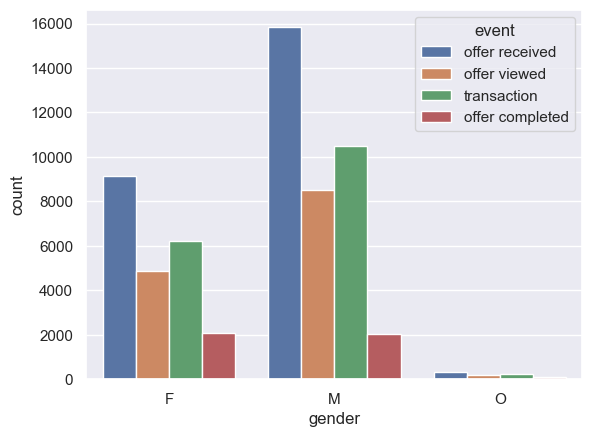

In [205]:
#distribution of offer event status per gender
sns.countplot(data=df,x='gender',hue='event')

<Axes: xlabel='offer_type', ylabel='count'>

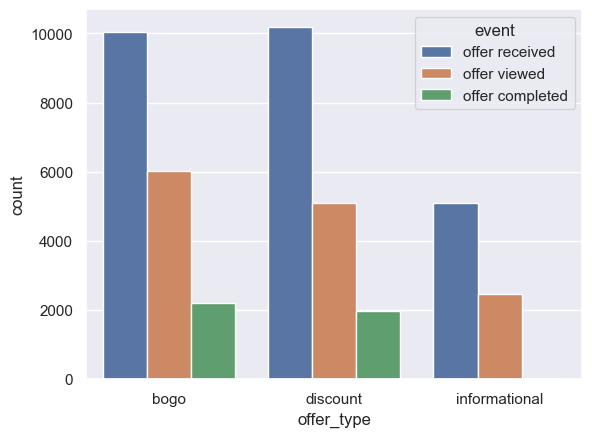

In [206]:
#distribution of offer event status
sns.countplot(data=df[df['event']!='transaction'],x='offer_type',hue='event')

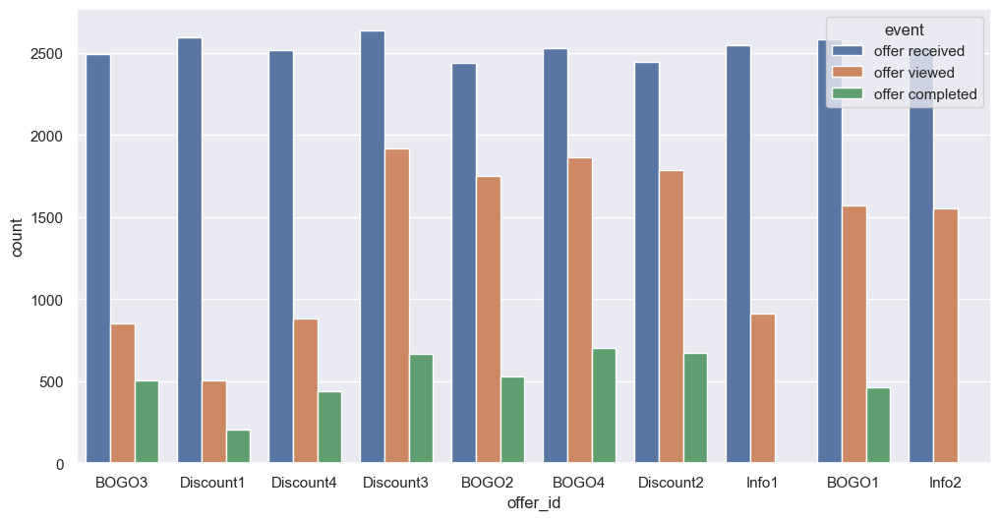

In [207]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))  # Set the figure size to (12, 6)
sns.countplot(data=df[df['event']!='transaction'], x='offer_id', hue='event')
plt.show()


In [208]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59980 entries, 0 to 59979
Data columns (total 42 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   customer_id       59980 non-null  object  
 1   event             59980 non-null  object  
 2   offer_id          59980 non-null  object  
 3   time              59980 non-null  int64   
 4   amount            59980 non-null  float64 
 5   offer completed   59980 non-null  int64   
 6   offer received    59980 non-null  int64   
 7   offer viewed      59980 non-null  int64   
 8   transaction       59980 non-null  int64   
 9   gender            59980 non-null  object  
 10  age               59980 non-null  int64   
 11  became_member_on  59980 non-null  float64 
 12  income            59980 non-null  int64   
 13  year              59980 non-null  float64 
 14  month             59980 non-null  float64 
 15  day               59980 non-null  float64 
 16  reward            5998

## Univariate Analysis

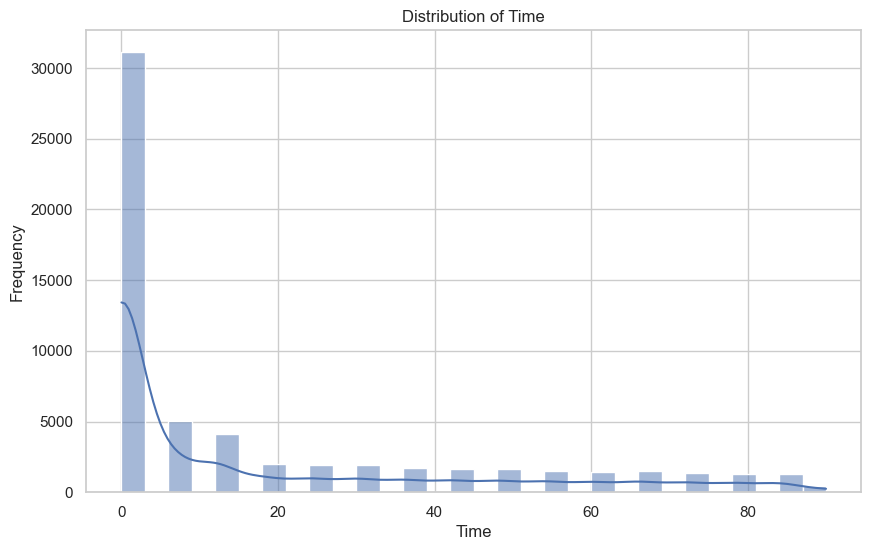

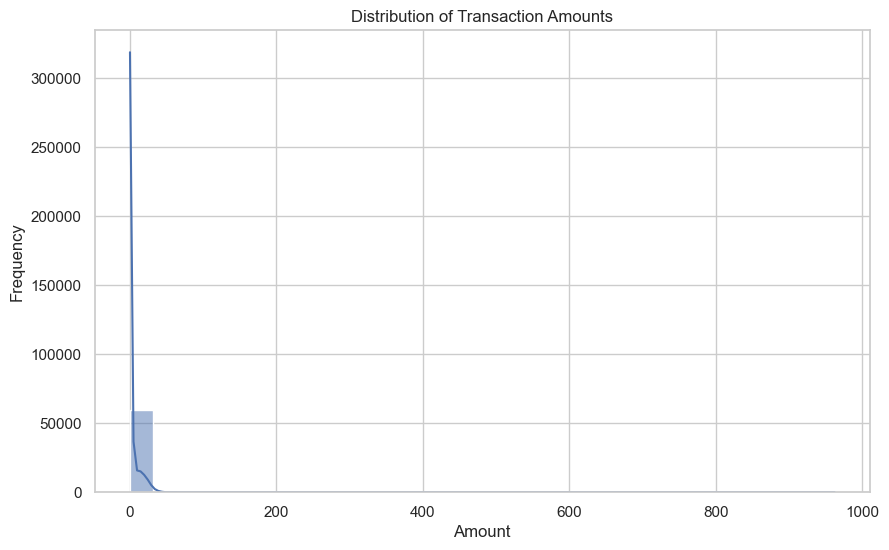

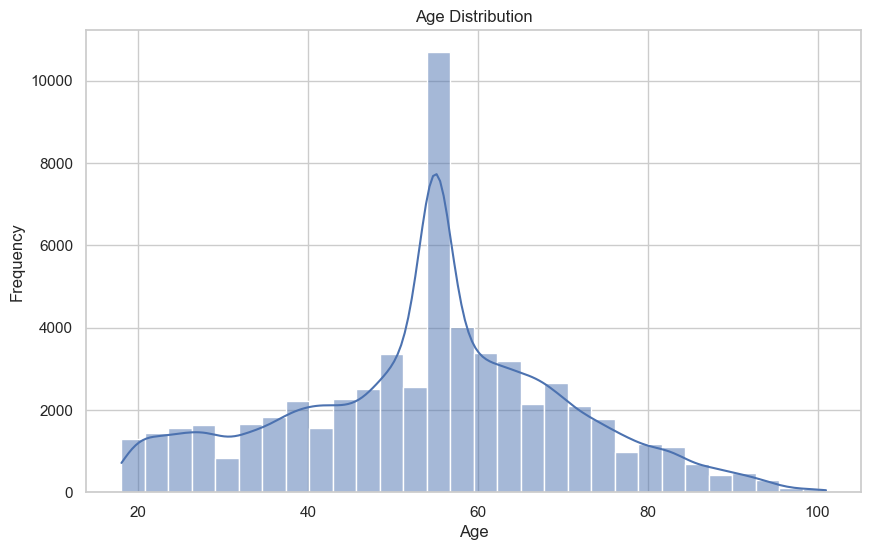

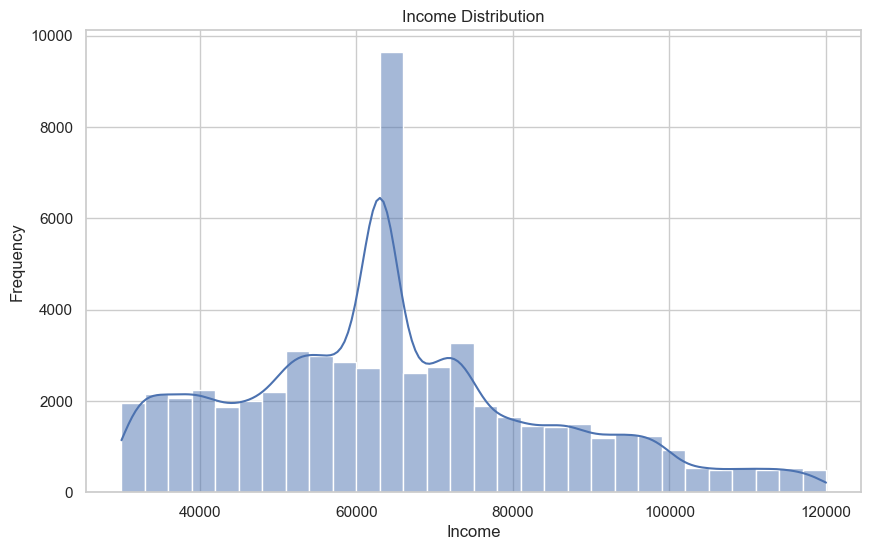

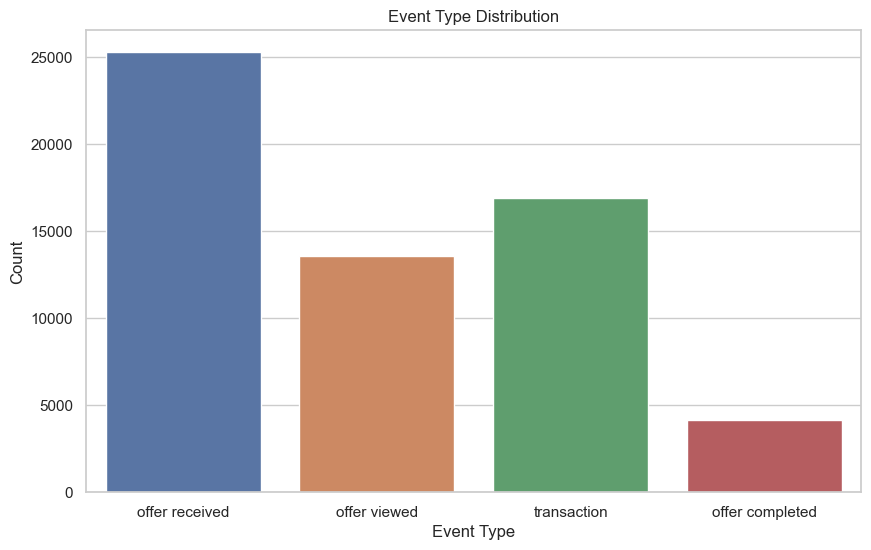

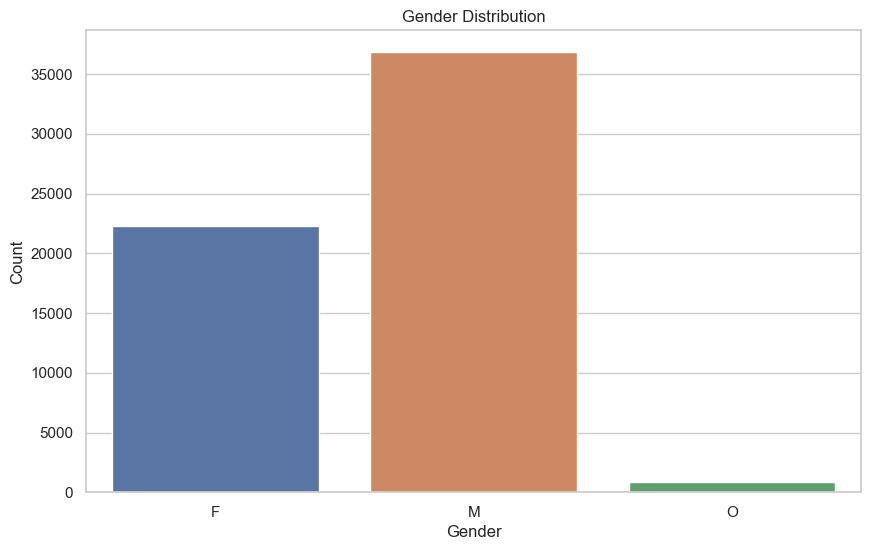

In [209]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting plot style
sns.set(style="whitegrid")

# Function to create histograms for numerical columns
def plot_histogram(data, column, title, xlabel, bins=30):
    plt.figure(figsize=(10, 6))
    sns.histplot(data[column], bins=bins, kde=True)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('Frequency')
    plt.show()

# Function to create count plots for categorical columns
def plot_countplot(data, column, title, xlabel):
    plt.figure(figsize=(10, 6))
    sns.countplot(x=column, data=data)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('Count')
    plt.show()

# Performing univariate analysis by plotting histograms and count plots
# Numerical columns: 'time', 'amount', 'age', 'income'
# Categorical columns: 'event', 'gender'

# Histograms for numerical columns
plot_histogram(df, 'time', 'Distribution of Time', 'Time')
plot_histogram(df, 'amount', 'Distribution of Transaction Amounts', 'Amount')
plot_histogram(df, 'age', 'Age Distribution', 'Age')
plot_histogram(df, 'income', 'Income Distribution', 'Income')

# Count plots for categorical columns
plot_countplot(df, 'event', 'Event Type Distribution', 'Event Type')
plot_countplot(df, 'gender', 'Gender Distribution', 'Gender')


### Bivariate analysis

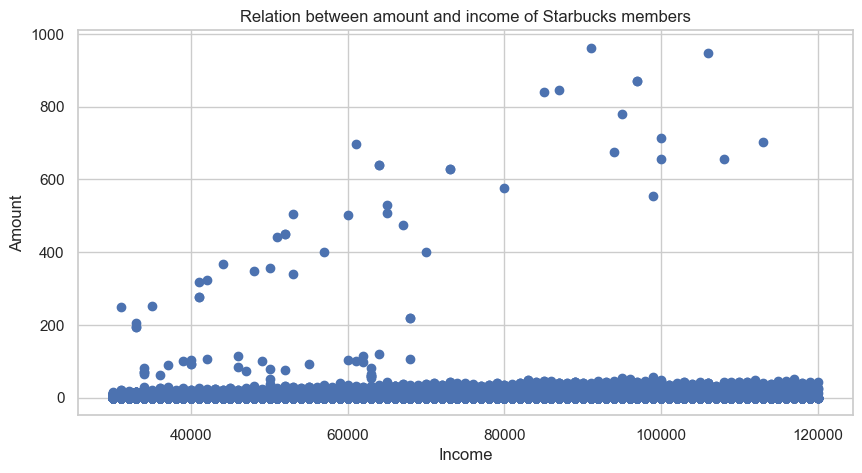

In [210]:
# Show bivariant analysis between amount and income 
fig, ax = plt.subplots(figsize=(10,5))
ax.scatter(df['income'], df['amount'])
ax.set_xlabel('Income')
ax.set_ylabel('Amount')
plt.title('Relation between amount and income of Starbucks members')
plt.show()

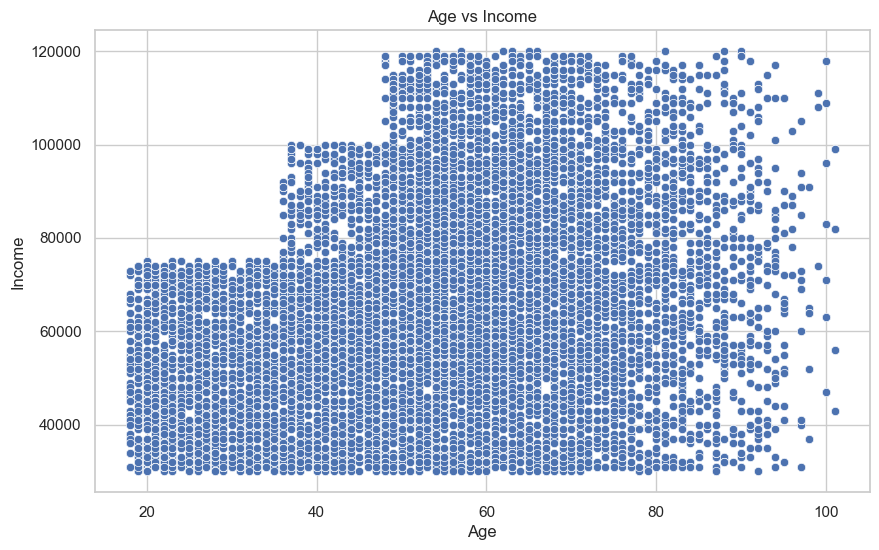

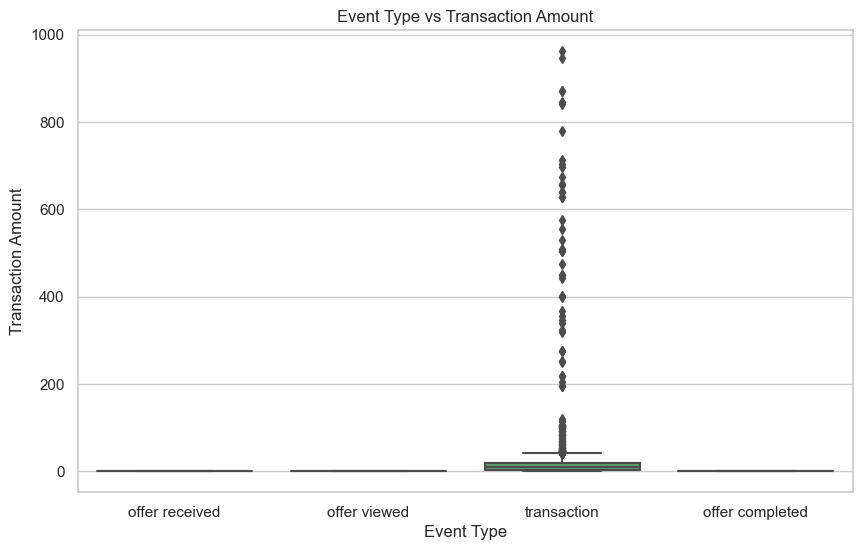

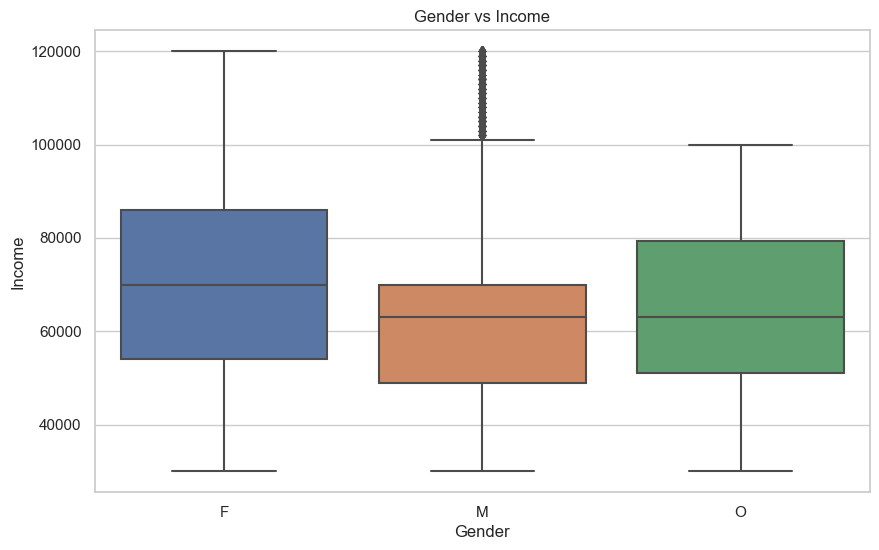

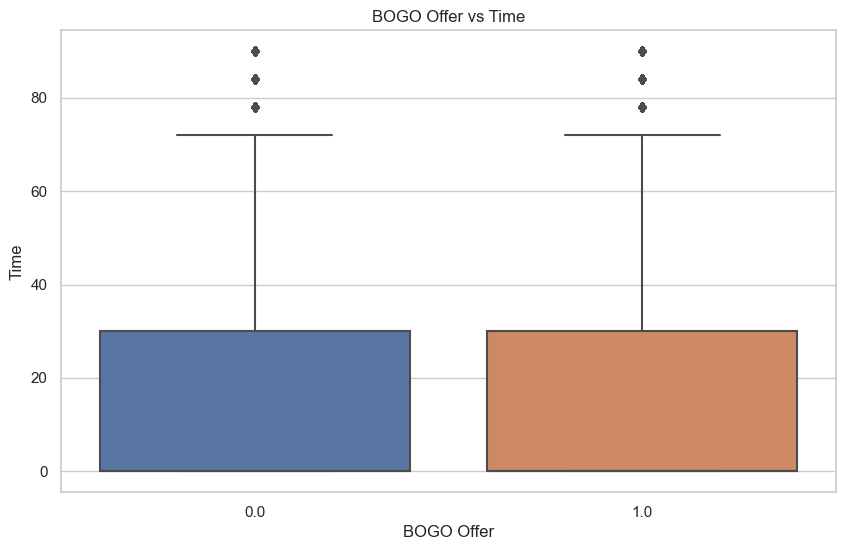

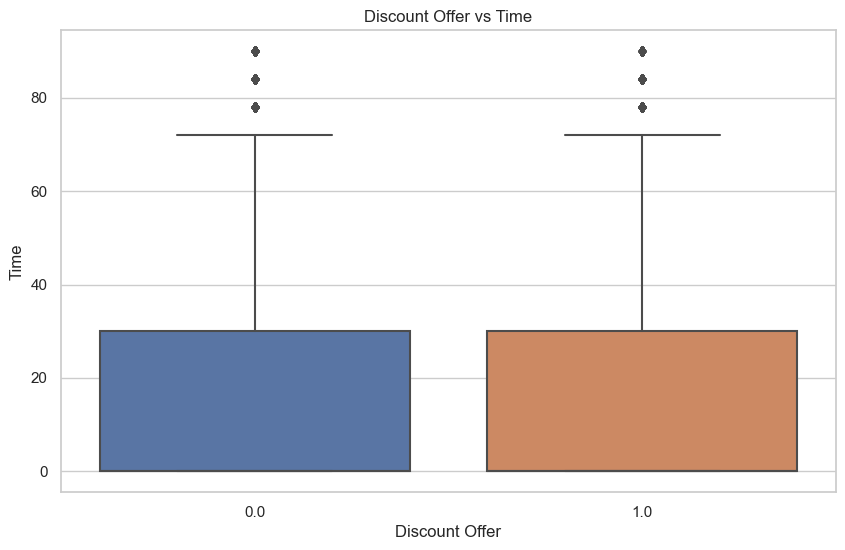

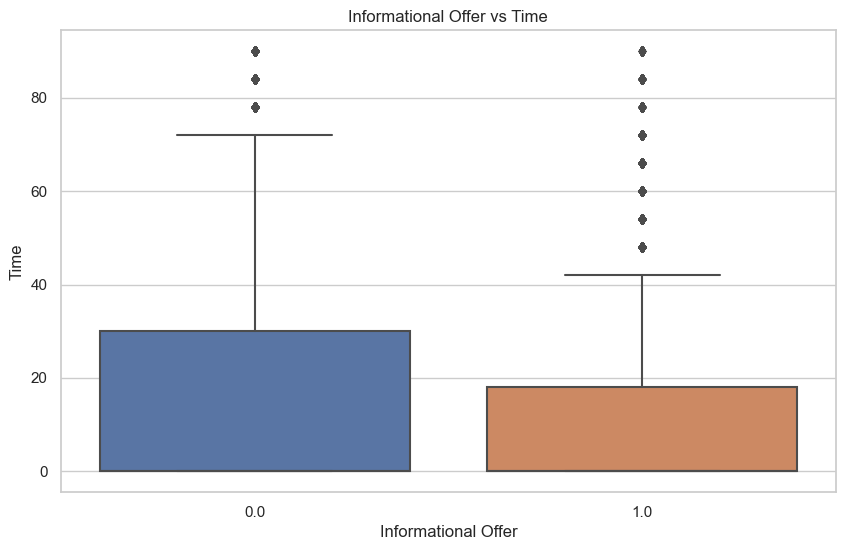

In [211]:
# Bivariate analysis: exploring relationships between different variables

# Function to create scatter plots for numerical vs numerical columns
def plot_scatter(data, x_column, y_column, title, xlabel, ylabel):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=x_column, y=y_column, data=data)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Function to create box plots for categorical vs numerical columns
def plot_boxplot(data, x_column, y_column, title, xlabel, ylabel):
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=x_column, y=y_column, data=data)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Scatter plot: Age vs Income
plot_scatter(df, 'age', 'income', 'Age vs Income', 'Age', 'Income')

# Box plot: Event Type vs Amount
plot_boxplot(df, 'event', 'amount', 'Event Type vs Transaction Amount', 'Event Type', 'Transaction Amount')

# Box plot: Gender vs Income
plot_boxplot(df, 'gender', 'income', 'Gender vs Income', 'Gender', 'Income')

# Box plot: Offer Type (BOGO, Discount, Informational) vs Time
plot_boxplot(df, 'bogo', 'time', 'BOGO Offer vs Time', 'BOGO Offer', 'Time')
plot_boxplot(df, 'discount', 'time', 'Discount Offer vs Time', 'Discount Offer', 'Time')
plot_boxplot(df, 'informational', 'time', 'Informational Offer vs Time', 'Informational Offer', 'Time')


### multivariate analysis

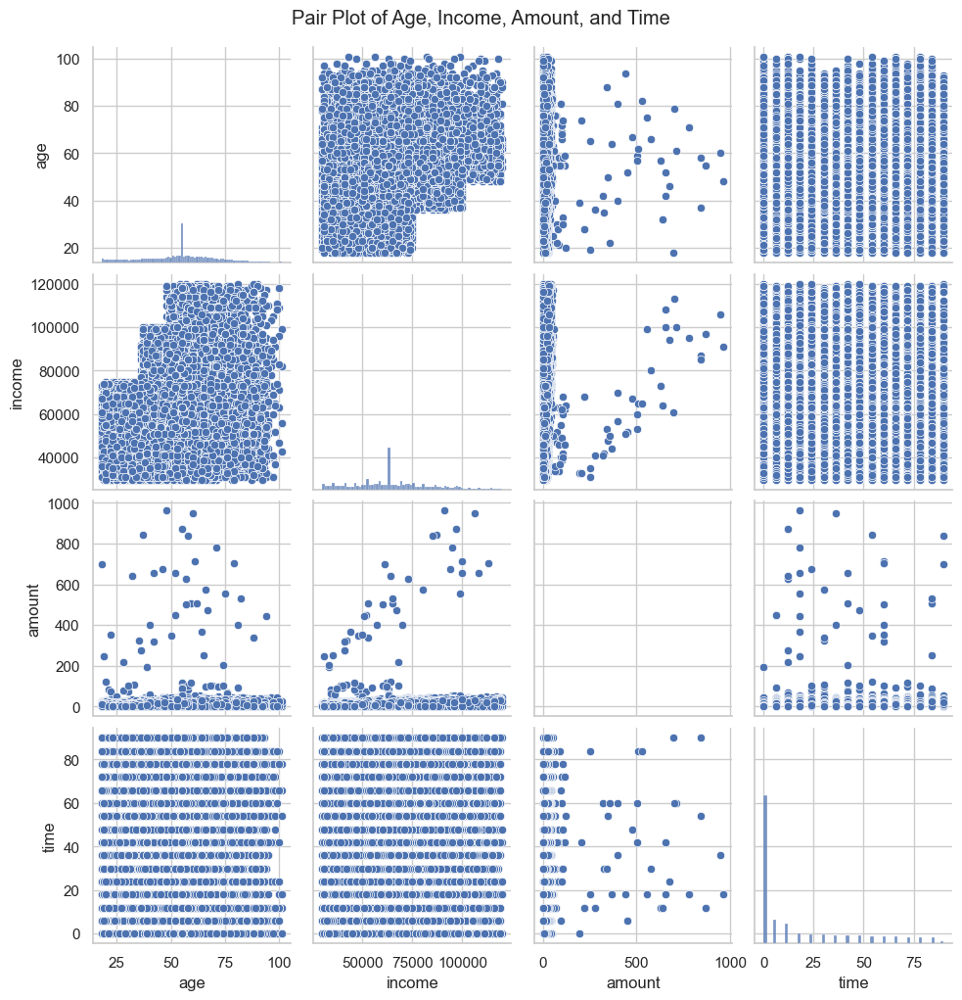

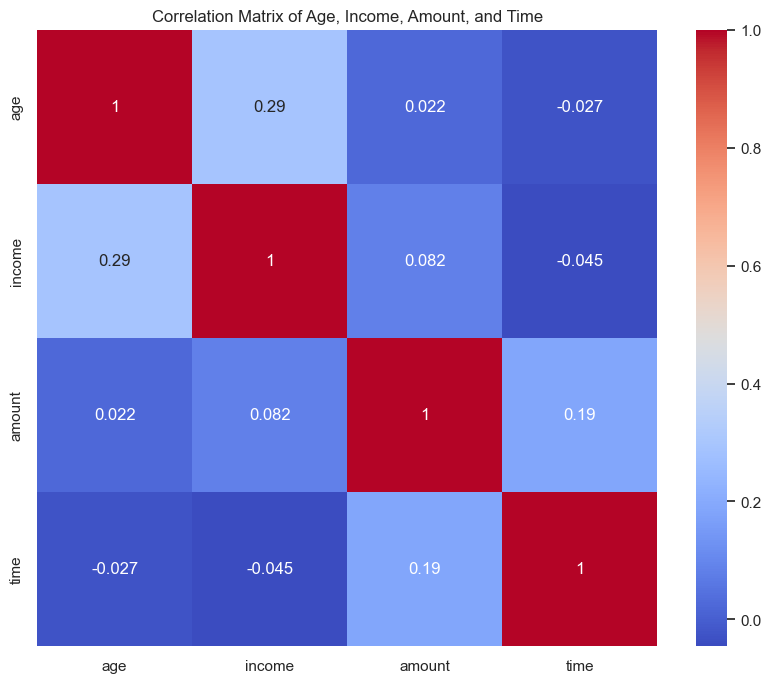

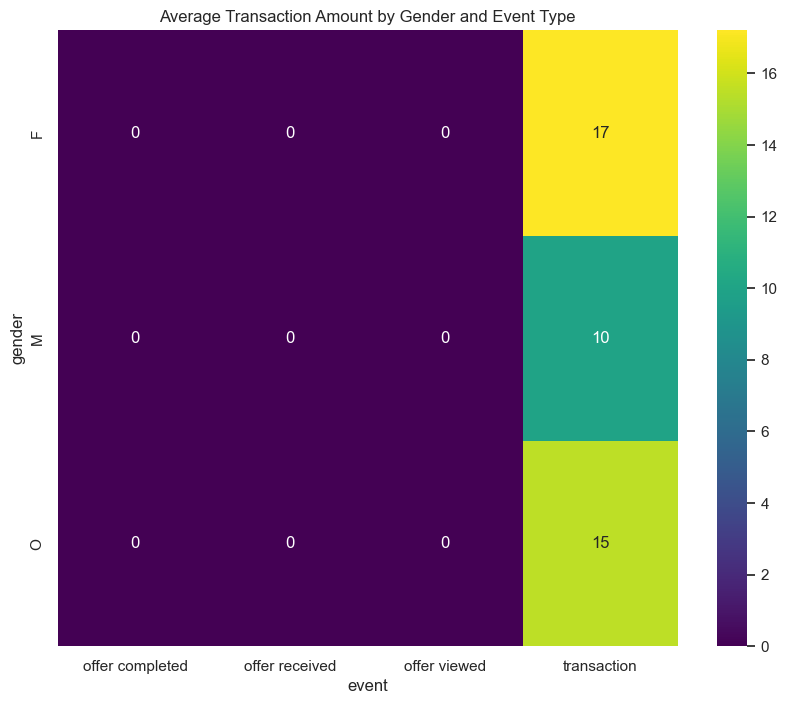

In [212]:
# Multivariate analysis: exploring relationships among multiple variables

# Pair plot for selected numerical variables
sns.pairplot(df[['age', 'income', 'amount', 'time']])
plt.suptitle("Pair Plot of Age, Income, Amount, and Time", y=1.02)
plt.show()

# Heatmap for correlations among numerical variables
plt.figure(figsize=(10, 8))
correlation_matrix = df[['age', 'income', 'amount', 'time']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix of Age, Income, Amount, and Time")
plt.show()

# Creating a pivot table for average amount by gender and event
pivot_table = df.pivot_table(values='amount', index='gender', columns='event', aggfunc='mean')

# Heatmap for pivot table
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_table, annot=True, cmap='viridis')
plt.title("Average Transaction Amount by Gender and Event Type")
plt.show()


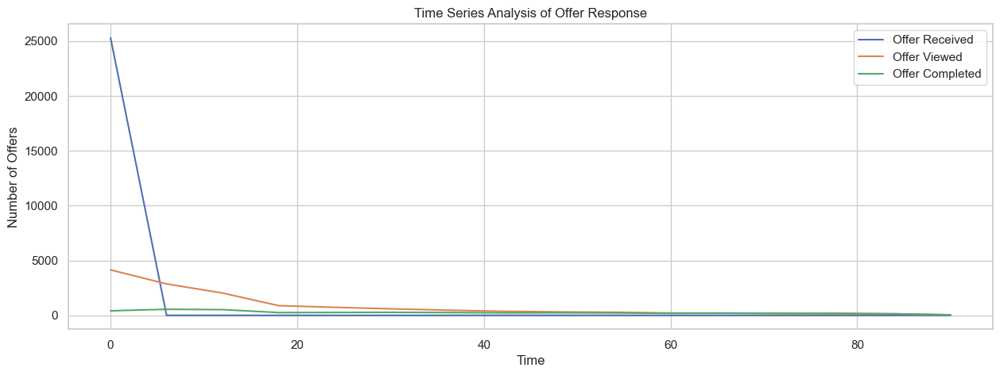

In [213]:
# Preparing data for time series analysis of offer response
# Using a list instead of a tuple for multiple columns
offer_response_time_corrected = df.groupby('time')[['offer received', 'offer viewed', 'offer completed']].sum().reset_index()

# Time Series Analysis of Offer Response
plt.figure(figsize=(15, 5))

# Plotting the number of offers received, viewed, and completed over time
sns.lineplot(x='time', y='offer received', data=offer_response_time_corrected, label='Offer Received')
sns.lineplot(x='time', y='offer viewed', data=offer_response_time_corrected, label='Offer Viewed')
sns.lineplot(x='time', y='offer completed', data=offer_response_time_corrected, label='Offer Completed')
plt.title('Time Series Analysis of Offer Response')
plt.xlabel('Time')
plt.ylabel('Number of Offers')
plt.legend()

plt.show()


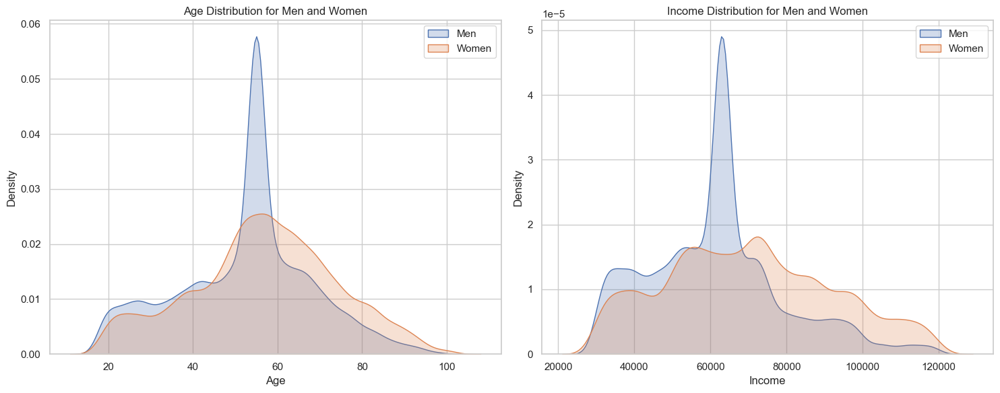

In [214]:

# Creating KDE plots for income and age for both men and women

plt.figure(figsize=(15, 6))

# KDE Plot for Age
plt.subplot(1, 2, 1)
sns.kdeplot(df[df['gender'] == 'M']['age'], label='Men', shade=True)
sns.kdeplot(df[df['gender'] == 'F']['age'], label='Women', shade=True)
plt.title('Age Distribution for Men and Women')
plt.xlabel('Age')
plt.ylabel('Density')
plt.legend()

# KDE Plot for Income
plt.subplot(1, 2, 2)
sns.kdeplot(df[df['gender'] == 'M']['income'], label='Men', shade=True)
sns.kdeplot(df[df['gender'] == 'F']['income'], label='Women', shade=True)
plt.title('Income Distribution for Men and Women')
plt.xlabel('Income')
plt.ylabel('Density')
plt.legend()

plt.tight_layout()
plt.show()


In [215]:
# Selecting a random customer from the dataset
random_customer_id = df['customer_id'].sample().iloc[0]

# Creating a transcript DataFrame for this customer
customer_transcript = df[df['customer_id'] == random_customer_id].groupby('offer_id').agg({
    'offer received': 'sum',
    'offer viewed': 'sum',
    'offer completed': 'sum'
}).reset_index()

customer_transcript['successful_offer'] = (
    (customer_transcript['offer viewed'] >= 1) & (customer_transcript['offer completed'] >= 1)
)

customer_transcript.head()


,offer_id,offer received,offer viewed,offer completed,successful_offer
0,Info1,2,2,0,False


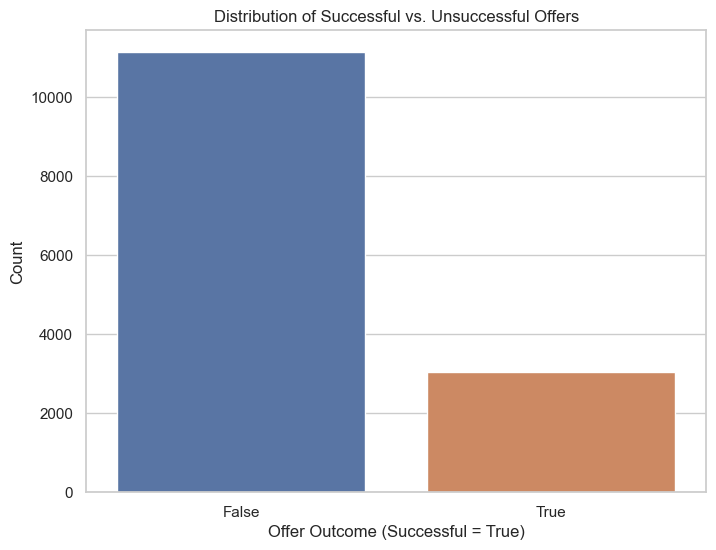

,Offer Outcome,Count
0,False,11134
1,True,3039


In [216]:
# Transforming the dataset for Profile and Offer Distributions by Offer Outcome

# Grouping data by customer_id and offer_id and counting the event types
profile_offer_distribution = df.groupby(['customer_id', 'offer_id']).agg({
    'offer received': 'sum',
    'offer viewed': 'sum',
    'offer completed': 'sum'
}).reset_index()

# Determining if the offer was successful
profile_offer_distribution['successful_offer'] = (
    (profile_offer_distribution['offer viewed'] >= 1) & (profile_offer_distribution['offer completed'] >= 1)
)

# Now, analyzing the distribution of profiles and offers based on the offer outcome
# Counting the number of successful and unsuccessful offers
offer_outcome_counts = profile_offer_distribution['successful_offer'].value_counts().reset_index()
offer_outcome_counts.columns = ['Offer Outcome', 'Count']

# Visualizing the distribution of successful vs. unsuccessful offers
plt.figure(figsize=(8, 6))
sns.barplot(x='Offer Outcome', y='Count', data=offer_outcome_counts)
plt.title('Distribution of Successful vs. Unsuccessful Offers')
plt.xlabel('Offer Outcome (Successful = True)')
plt.ylabel('Count')
plt.show()

# Note: Further analysis can be done to break down these distributions by customer demographics or offer types.
offer_outcome_counts.head()


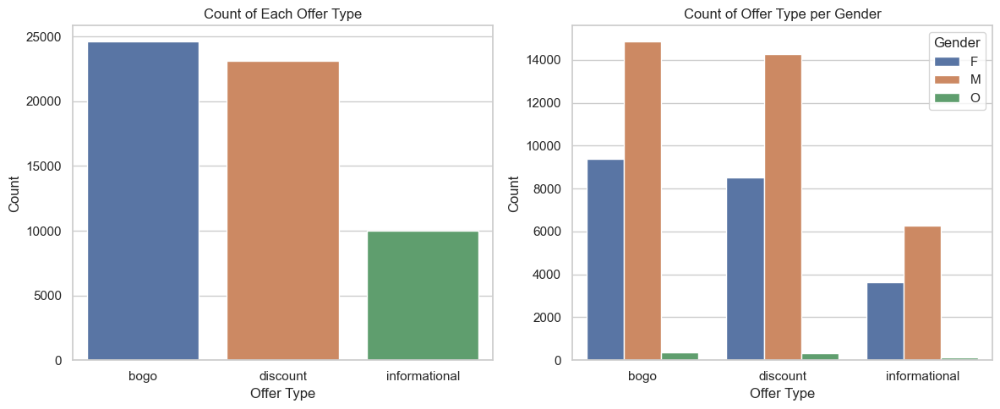

In [217]:
# Analysis 1: Count for Offer Type

# Counting the number of each offer type
offer_type_counts = df[['bogo', 'discount', 'informational']].sum().reset_index()
offer_type_counts.columns = ['Offer Type', 'Count']

# Analysis 2: Count for Offer Type per Gender

# Creating a dataframe with gender and offer types
gender_offer_counts = df.groupby('gender')[['bogo', 'discount', 'informational']].sum().reset_index()

# Visualizations

# Visualization for Count of Each Offer Type
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.barplot(x='Offer Type', y='Count', data=offer_type_counts)
plt.title('Count of Each Offer Type')
plt.xlabel('Offer Type')
plt.ylabel('Count')

# Visualization for Count of Offer Type per Gender
plt.subplot(1, 2, 2)
gender_offer_counts_melted = gender_offer_counts.melt(id_vars='gender', var_name='Offer Type', value_name='Count')
sns.barplot(x='Offer Type', y='Count', hue='gender', data=gender_offer_counts_melted)
plt.title('Count of Offer Type per Gender')
plt.xlabel('Offer Type')
plt.ylabel('Count')
plt.legend(title='Gender')

plt.tight_layout()
plt.show()


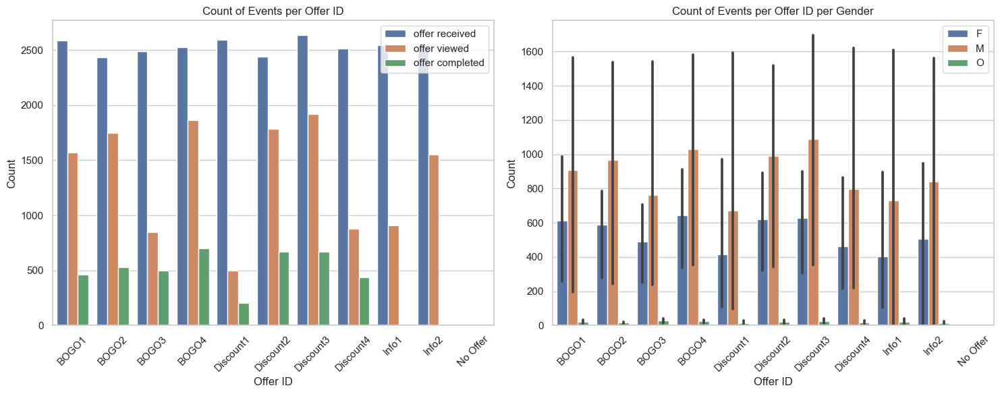

In [218]:
# Analysis for count of events per offer_id

# Counting the number of events (received, viewed, completed) for each offer_id
offer_id_counts = df.groupby('offer_id')[['offer received', 'offer viewed', 'offer completed']].sum().reset_index()

# Count of events per offer_id per gender
gender_offer_id_counts = df.groupby(['gender', 'offer_id'])[['offer received', 'offer viewed', 'offer completed']].sum().reset_index()

# Visualizations

# Visualization for Count of Events per Offer ID
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
offer_id_counts_melted = offer_id_counts.melt(id_vars='offer_id', var_name='Offer Event', value_name='Count')
sns.barplot(x='offer_id', y='Count', hue='Offer Event', data=offer_id_counts_melted)
plt.title('Count of Events per Offer ID')
plt.xlabel('Offer ID')
plt.xticks(rotation=45)
plt.ylabel('Count')
plt.legend()

# Visualization for Count of Events per Offer ID per Gender
plt.subplot(1, 2, 2)
gender_offer_id_counts_melted = gender_offer_id_counts.melt(id_vars=['gender', 'offer_id'], var_name='Offer Event', value_name='Count')
sns.barplot(x='offer_id', y='Count', hue='gender', data=gender_offer_id_counts_melted)
plt.title('Count of Events per Offer ID per Gender')
plt.xlabel('Offer ID')
plt.xticks(rotation=45)
plt.ylabel('Count')
plt.legend()

plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Offer ID')

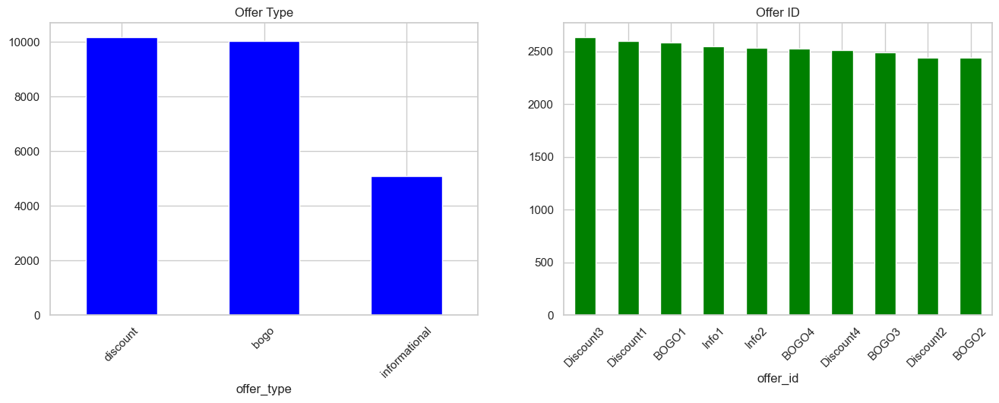

In [219]:
plt.subplot(121)
df[df['offer received'] == 1].offer_type.value_counts().plot(kind='bar', rot=45, figsize=(16,5), color='blue')
plt.title('Offer Type')

plt.subplot(122)
df[df['offer received'] == 1].offer_id.value_counts().plot(kind='bar', rot=45, color='green')
plt.title('Offer ID')

In [220]:
df[df['offer received'] == 1].offer_id.value_counts()

offer_id
Discount3    2636
Discount1    2594
BOGO1        2584
Info1        2546
Info2        2532
BOGO4        2526
Discount4    2514
BOGO3        2490
Discount2    2442
BOGO2        2436
Name: count, dtype: int64

Each offer was received almost the same number of times. The data simulator probably used a uniform distribution for distributing the offers.



## Customer Analysis


In [221]:
import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Filter for transaction data
transaction_data = df[df['transaction'] == 1]

# Calculate total expenses and transaction counts
total_expenses = transaction_data.groupby('customer_id')['amount'].sum().reset_index()
transaction_counts = transaction_data.groupby('customer_id').size().reset_index(name='transaction_count')
customer_expenses = total_expenses.merge(transaction_counts, on='customer_id')
customer_expenses['average_transaction'] = customer_expenses['amount'] / customer_expenses['transaction_count']

# Plotting
fig = make_subplots(rows=1, cols=2, subplot_titles=("Average Transaction per Customer", "Total Expenses per Customer"))
fig.add_trace(go.Histogram(x=customer_expenses['average_transaction'], nbinsx=400), row=1, col=1)
fig.add_trace(go.Histogram(x=customer_expenses['amount'], nbinsx=100), row=1, col=2)
fig.update_layout(height=400, width=800, showlegend=False)
fig.update_xaxes(title_text="Average Transaction ($)", row=1, col=1)
fig.update_xaxes(title_text="Total Expenses ($)", row=1, col=2)
fig.show()


In [222]:
# Group by average transaction and count customers
average_transaction_counts = customer_expenses.groupby('average_transaction').size().reset_index(name='customer_count')

# Plotting
fig = go.Figure(data=[go.Bar(x=average_transaction_counts['average_transaction'], y=average_transaction_counts['customer_count'])])
fig.update_layout(title_text='Number of Customers per Average Transaction Amount', xaxis_title='Average Transaction ($)', yaxis_title='Number of Customers')
fig.show()

In [223]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Assuming 'amount' column represents transaction amount and 'transaction' column to identify transactions
# Filtering data for transactions
transaction_data = df[df['transaction'] == 1]

# Calculating total expenses for each customer
total_expenses = transaction_data.groupby('customer_id')['amount'].sum().reset_index()

# Calculating the number of transactions for each customer
transaction_counts = transaction_data.groupby('customer_id').size().reset_index(name='transaction_count')

# Merging total expenses and transaction counts
customer_expenses = total_expenses.merge(transaction_counts, on='customer_id')

# Calculating average transaction amount for each customer
customer_expenses['average_transaction'] = customer_expenses['amount'] / customer_expenses['transaction_count']

# Plotting with Plotly
fig = make_subplots(rows=1, cols=2, subplot_titles=("Average Transaction per Customer", "Total Expenses per Customer"))

# Average Transaction Plot
fig.add_trace(go.Histogram(x=customer_expenses['average_transaction'], nbinsx=400), row=1, col=1)

# Total Expenses Plot
fig.add_trace(go.Histogram(x=customer_expenses['amount'], nbinsx=100), row=1, col=2)

# Update layout
fig.update_layout(height=400, width=800, showlegend=False)
fig.update_xaxes(title_text="Average Transaction ($)", row=1, col=1)
fig.update_xaxes(title_text="Total Expenses ($)", row=1, col=2)

# Show the plot
fig.show()


In [224]:
#success rate of offers
offer_customer = merged_df.groupby(['customer_id','offer_id','event'])['time'].count().unstack()
    
offer_customer.reset_index(level=[0,1],inplace = True)
offer_customer['successful offer'] = offer_customer['offer completed'] * offer_customer['offer viewed']
    
offer_customer['successful offer'] = offer_customer['successful offer'].apply(lambda x: 1.0 if x > 0 else 0.0)
    

In [225]:
offer_customer['successful offer'].value_counts()

successful offer
0.0    11134
1.0     3039
Name: count, dtype: int64

In [226]:
df = pd.concat([df, offer_customer['successful offer']], axis=1)


In [227]:
df['successful offer'].value_counts()

successful offer
0.0    11134
1.0     3039
Name: count, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'BOGO3'),
  Text(1, 0, 'Discount1'),
  Text(2, 0, 'Discount4'),
  Text(3, 0, 'Discount3'),
  Text(4, 0, 'BOGO2'),
  Text(5, 0, 'BOGO4'),
  Text(6, 0, 'Discount2'),
  Text(7, 0, 'Info1'),
  Text(8, 0, 'BOGO1'),
  Text(9, 0, 'Info2'),
  Text(10, 0, 'No Offer')])

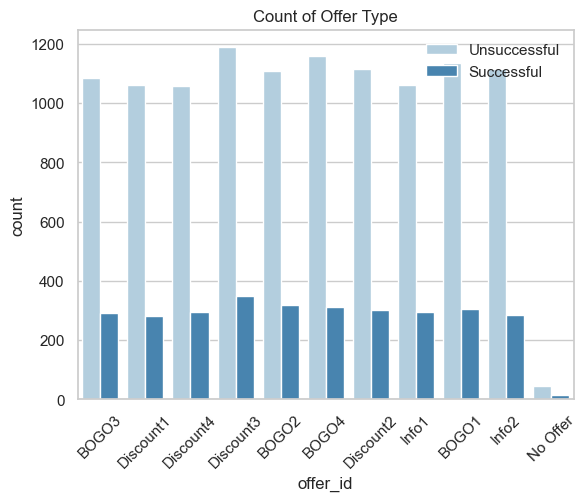

In [228]:
sns.countplot(x='offer_id',hue='successful offer',data=df,palette='Blues');
plt.legend(['Unsuccessful','Successful'],frameon=False)
plt.title('Count of Offer Type')

plt.xticks(rotation=45)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Discount1'),
  Text(1, 0, 'BOGO1'),
  Text(2, 0, 'Discount3'),
  Text(3, 0, 'BOGO2'),
  Text(4, 0, 'Discount4'),
  Text(5, 0, 'Discount2'),
  Text(6, 0, 'BOGO4'),
  Text(7, 0, 'Info2'),
  Text(8, 0, 'BOGO3'),
  Text(9, 0, 'Info1'),
  Text(10, 0, 'No Offer')])

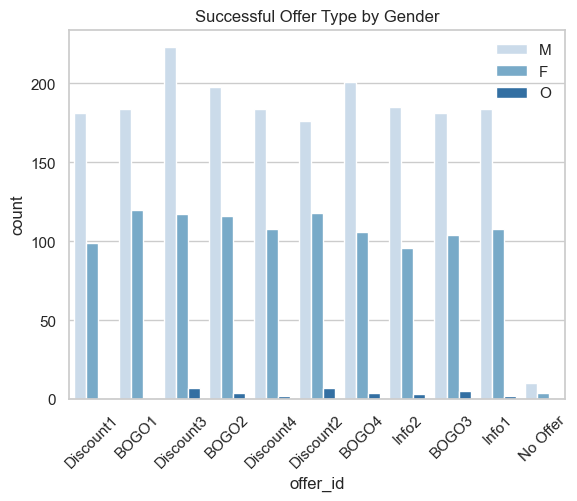

In [229]:
successful = df.loc[df['successful offer']==1]
sns.countplot(x='offer_id',hue='gender',data=successful,palette='Blues')
plt.legend(['M','F','O'],frameon=False)
plt.title('Successful Offer Type by Gender')

plt.xticks(rotation=45)

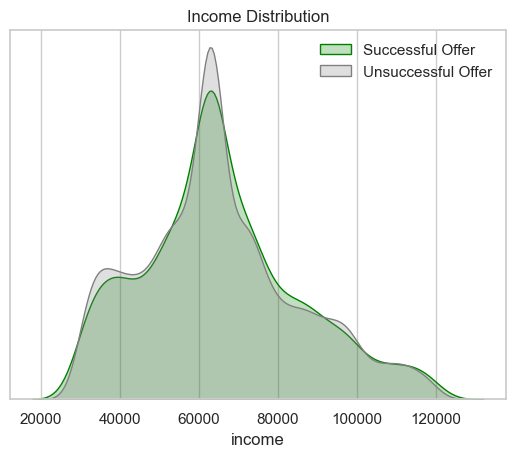

In [230]:
#Distribution of income whether offer was successful
sns.distplot(df.loc[df['successful offer'] == 1]['income'],hist=False,color='green',kde_kws={'shade':True})
sns.distplot(df.loc[df['successful offer'] == 0]['income'],hist=False,color='grey',kde_kws={'shade':True})
plt.legend(['Successful Offer', 'Unsuccessful Offer'], frameon=False)
plt.gca().get_yaxis().set_visible(False)
plt.title('Income Distribution');


In [231]:
# gende_dist= df.groupby(['gender'])['successful offer'].sum()

# plt.pie(_, labels = gende_dist.index,shadow=True,explode = (0.05,0.05,0.05),colors=['coral','lightblue','green'])
# plt.legend(['Female','Male','Other'],frameon=False)
# plt.title("Successful Offer by Gender")
import plotly.graph_objects as go

gender_dist = df.groupby(['gender'])['successful offer'].sum()

fig = go.Figure(data=[go.Pie(labels=gender_dist.index, values=gender_dist)])
fig.update_traces(marker=dict(colors=['coral', 'lightblue', 'green']), 
                  hoverinfo='label+percent', 
                  textinfo='label',
                  textfont=dict(size=12),
                  textposition='inside')
fig.update_layout(title="Successful Offer by Gender")
fig.show()

# plt.gca().axis('Equal')


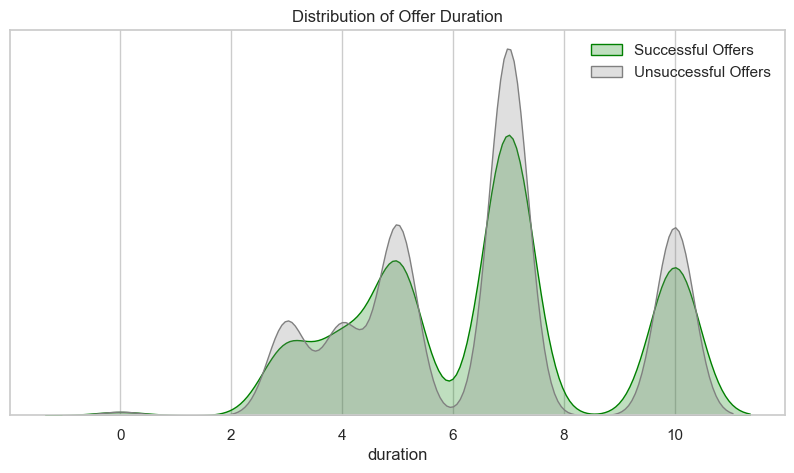

In [232]:
# Set the figure size before creating the plots
plt.figure(figsize=(10, 5))

# Filter data for successful and unsuccessful offers
success_data = df[df['successful offer'] == 1]['duration']
unsuccess_data = df[df['successful offer'] == 0]['duration']

# Plot the KDE for successful offers in green
sns.distplot(success_data, hist=False, color='green', kde_kws={'shade': True})

# Plot the KDE for unsuccessful offers in grey
sns.distplot(unsuccess_data, hist=False, color='grey', kde_kws={'shade': True})

# Add legend and title
plt.legend(['Successful Offers', 'Unsuccessful Offers'], frameon=False)
plt.title('Distribution of Offer Duration')

# Hide the y-axis ticks and labels
plt.gca().get_yaxis().set_visible(False)

# Show the plot
plt.show()

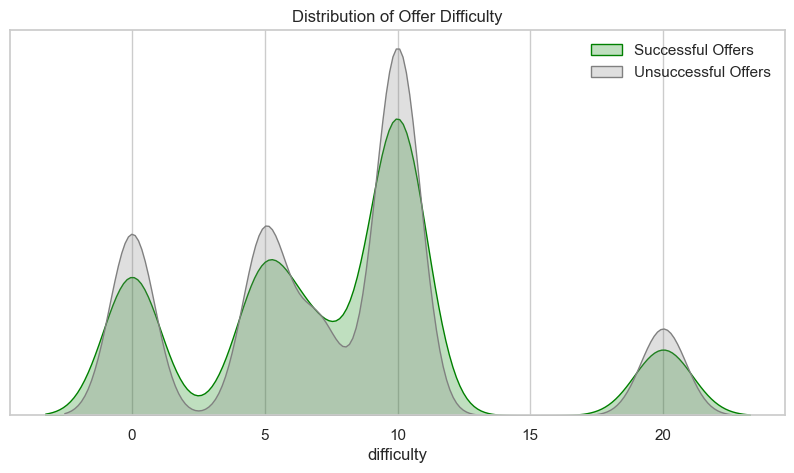

In [233]:
# Set the figure size before creating the plots
plt.figure(figsize=(10, 5))

# Filter data for successful and unsuccessful offers
success_data = df[df['successful offer'] == 1]['difficulty']
unsuccess_data = df[df['successful offer'] == 0]['difficulty']

# Plot the KDE for successful offers in green
sns.kdeplot(success_data, color='green', fill=True, label='Successful Offers')

# Plot the KDE for unsuccessful offers in grey
sns.kdeplot(unsuccess_data, color='grey', fill=True, label='Unsuccessful Offers')

# Add legend and title
plt.legend(frameon=False)
plt.title('Distribution of Offer Difficulty')

# Hide the y-axis ticks and labels
plt.gca().get_yaxis().set_visible(False)

# Show the plot
plt.show()

In [234]:

# Filter out only the transaction events for the calculations
transactions = df[df['event'] == 'transaction']

# Create income brackets using quantiles
income_brackets = pd.qcut(transactions['income'], q=4, duplicates='drop').cat.categories

# Calculate average transaction value per income bracket
avg_transaction_value = transactions.groupby(pd.qcut(transactions['income'], q=4, duplicates='drop'))['amount'].mean()

# Calculate total expenses per income bracket
total_expenses = transactions.groupby(pd.qcut(transactions['income'], q=4, duplicates='drop'))['amount'].sum()

# Convert the resulting Series into DataFrames for easier plotting
avg_transaction_value_df = avg_transaction_value.reset_index(name='Average Transaction Value')
total_expenses_df = total_expenses.reset_index(name='Total Expenses')

# Display the income brackets and the corresponding DataFrames for validation
print(income_brackets)
print ("#*"*100)
print(avg_transaction_value_df)
print ("#*"*100)
print(total_expenses_df) 


IntervalIndex([(29999.999, 48000.0], (48000.0, 63000.0], (63000.0, 72000.0], (72000.0, 120000.0]], dtype='interval[float64, right]')
#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*
                 income  Average Transaction Value
0  (29999.999, 48000.0]                   6.748617
1    (48000.0, 63000.0]                   8.342919
2    (63000.0, 72000.0]                  13.800059
3   (72000.0, 120000.0]                  24.942985
#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*
                 income  Total Expenses
0  (29999.999, 48000.0]        29572.44
1    (48000.0, 63000.0]        50508.03
2    (63000.0, 72000.0]        32940.74
3   (72000.0, 120000.0]       102266.24


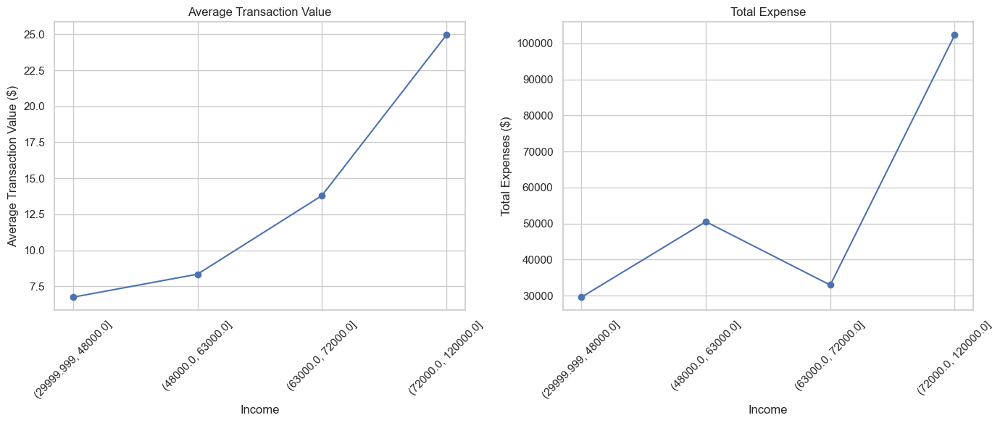

In [235]:

# Plotting the average transaction value
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(avg_transaction_value_df['income'].astype(str), avg_transaction_value_df['Average Transaction Value'], marker='o')
plt.title('Average Transaction Value')
plt.xlabel('Income')
plt.ylabel('Average Transaction Value ($)')
plt.xticks(rotation=45)
plt.grid(True)

# Plotting the total expenses
plt.subplot(1, 2, 2)
plt.plot(total_expenses_df['income'].astype(str), total_expenses_df['Total Expenses'], marker='o')
plt.title('Total Expense')
plt.xlabel('Income')
plt.ylabel('Total Expenses ($)')
plt.xticks(rotation=45)
plt.grid(True)

# Improve the layout and display the plot
plt.tight_layout()
plt.show()


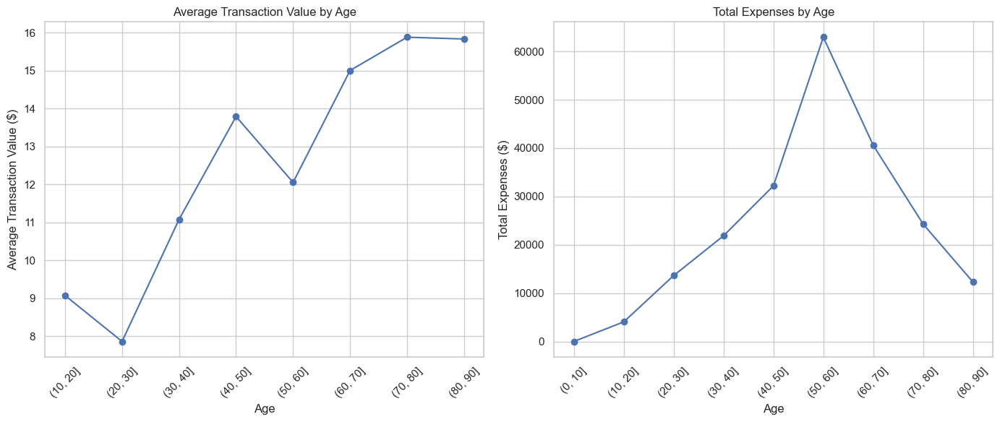

In [236]:
# Define age brackets using 10-year intervals
age_brackets = pd.cut(transactions['age'], bins=range(0, 100, 10))

# Calculate average transaction value per age bracket
avg_transaction_value_by_age = transactions.groupby(pd.cut(transactions['age'], bins=range(0, 100, 10)))['amount'].mean()

# Calculate total expenses per age bracket
total_expenses_by_age = transactions.groupby(pd.cut(transactions['age'], bins=range(0, 100, 10)))['amount'].sum()

# Convert the resulting Series into DataFrames for easier plotting
avg_transaction_value_by_age_df = avg_transaction_value_by_age.reset_index(name='Average Transaction Value')
total_expenses_by_age_df = total_expenses_by_age.reset_index(name='Total Expenses')

# Plotting the results
plt.figure(figsize=(14, 6))

# Average Transaction Value by Age
plt.subplot(1, 2, 1)
plt.plot(avg_transaction_value_by_age_df['age'].astype(str), avg_transaction_value_by_age_df['Average Transaction Value'], marker='o')
plt.title('Average Transaction Value by Age')
plt.xlabel('Age')
plt.ylabel('Average Transaction Value ($)')
plt.xticks(rotation=45)
plt.grid(True)

# Total Expenses by Age
plt.subplot(1, 2, 2)
plt.plot(total_expenses_by_age_df['age'].astype(str), total_expenses_by_age_df['Total Expenses'], marker='o')
plt.title('Total Expenses by Age')
plt.xlabel('Age')
plt.ylabel('Total Expenses ($)')
plt.xticks(rotation=45)
plt.grid(True)

# Improve layout and display the plots
plt.tight_layout()
plt.show()


In [237]:
# Calculate average transaction value per gender
avg_transaction_value_by_gender = transactions.groupby('gender')['amount'].mean()

# Calculate total expenses per gender
total_expenses_by_gender = transactions.groupby('gender')['amount'].sum()

# Display the calculated metrics
avg_transaction_value_by_gender, total_expenses_by_gender


(gender
 F    17.202507
 M    10.005156
 O    15.469430
 Name: amount, dtype: float64,
 gender
 F    106896.38
 M    104864.04
 O      3527.03
 Name: amount, dtype: float64)

In [238]:
#plotting the results by plotly 
px.bar(avg_transaction_value_by_gender,)

In [239]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import iplot

# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2, subplot_titles=("Average Transaction Value", "Total Expenses"))

# Add the bar chart for average transaction value
fig.add_trace(go.Bar(
    x=avg_transaction_value_by_gender.index,
    y=avg_transaction_value_by_gender.values,
    name='Average Transaction Value',
    marker=dict(color='royalblue')
), row=1, col=1)

# Add the bar chart for total expenses
fig.add_trace(go.Bar(
    x=total_expenses_by_gender.index,
    y=total_expenses_by_gender.values,
    name='Total Expenses',
    marker=dict(color='darkblue')
), row=1, col=2)

# Update the layout
fig.update_layout(
    title='Transaction Metrics by Gender',
    xaxis=dict(title='Gender'),
    yaxis=dict(title='Value ($)'),
    barmode='group'
)

# Show the figure
iplot(fig)


### Offer analysis  

In [240]:
#pie chart for offer type 
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import iplot
df.offer_type.value_counts()
fig = go.Figure(data=[go.Pie(labels=df.offer_type.value_counts().index, values=df.offer_type.value_counts().values)])
fig.update_layout(title_text='Distribution of Offer Types')
fig.show()

In [241]:
age_dist = px.histogram(merged_df, x='age', title='Age Distribution')

# Income Distribution
income_dist = px.histogram(merged_df, x='income', title='Income Distribution')

# Distribution of Transaction Amounts
amount_dist = px.histogram(merged_df, x='amount', title='Transaction Amount Distribution')

# Multivariate Analysis: Exploring relationships between different variables
# Age vs Income
age_income_scatter = px.scatter(merged_df, x='age', y='income', title='Age vs Income')

# Amount vs Time
amount_time_scatter = px.scatter(merged_df, x='time', y='amount', title='Amount vs Time')

# Plotting the figures
age_dist.show()
income_dist.show()
amount_dist.show()
age_income_scatter.show()
amount_time_scatter.show()

# Returning the plot objects for further use
# age_dist, income_dist, amount_dist, age_income_scatter, amount_time_scatter


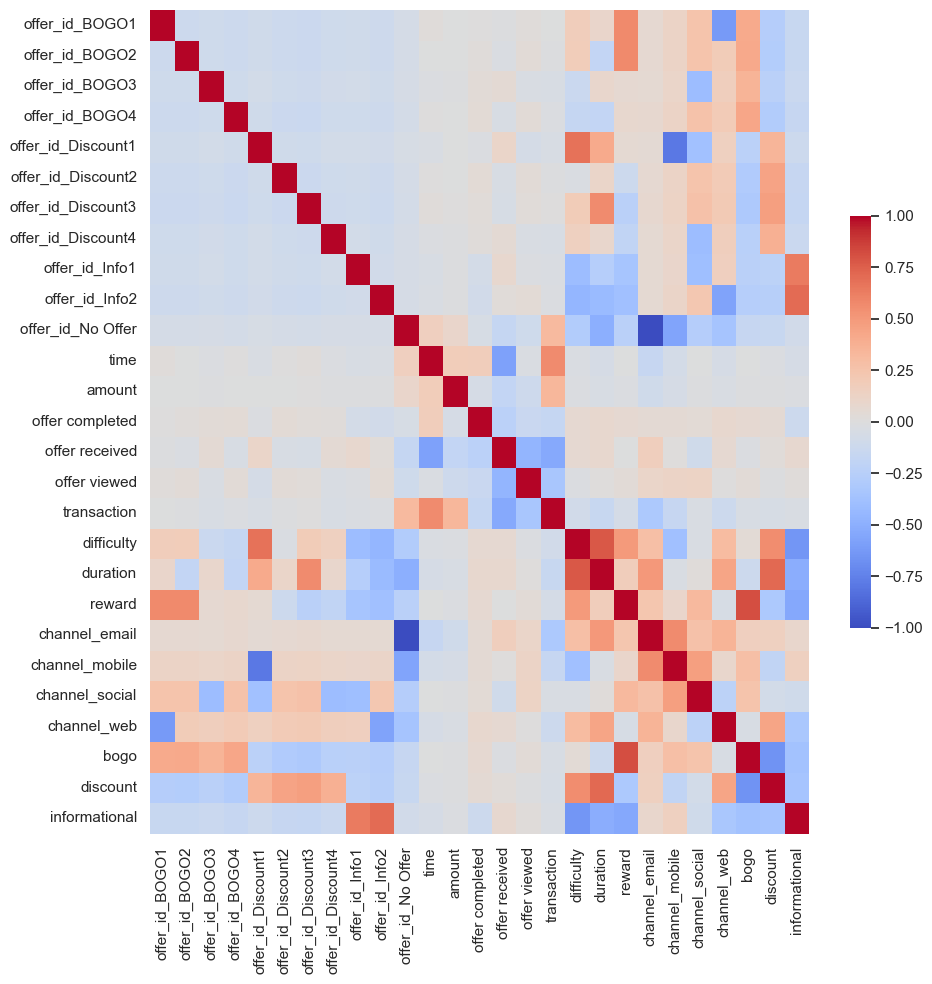

In [242]:
# One-hot encode the 'offer_id' column
data_with_one_hot = pd.get_dummies(df, columns=['offer_id'])

# Select relevant columns for the new heatmap, including one-hot encoded 'offer_id'
relevant_columns = [
    'time', 'amount', 'offer completed', 'offer received', 'offer viewed',
    'transaction', 'difficulty', 'duration', 'reward', 'channel_email', 
    'channel_mobile', 'channel_social', 'channel_web', 'bogo', 'discount', 
    'informational'
]
new_relevant_columns = [col for col in data_with_one_hot.columns if col.startswith('offer_id_')]

new_relevant_columns.extend(relevant_columns)

# Calculate the new correlation matrix with one-hot encoded 'offer_id'
new_corr = data_with_one_hot[new_relevant_columns].corr()

# Set up the matplotlib figure for the new heatmap
plt.figure(figsize=(10, 10))

# Draw the new heatmap
sns.heatmap(new_corr, annot=False, cmap='coolwarm', cbar_kws={'shrink': .5})

# Adjust the plot
plt.xticks(rotation=90, ha='center')
plt.yticks(rotation=0)
plt.tight_layout()



### I see that email channel is the least used channel so I will drop it from the dataset

## Modelling

In [243]:
df.to_csv('modelling.csv', index=False)

In [244]:
df.head()   

,customer_id,event,offer_id,time,amount,offer completed,offer received,offer viewed,transaction,gender,...,age_20_to__30,age_30_to__40,age_40_to__50,age_50_to__60,age_60_to__70,age_70_to__80,age_80_to__90,age_90_to__100,age_100_to__110,successful offer
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,BOGO3,0,0.0,0,1,0,0,F,...,False,False,False,False,False,True,False,False,False,0.0
1,a03223e636434f42ac4c3df47e8bac43,offer received,Discount1,0,0.0,0,1,0,0,M,...,False,False,False,True,False,False,False,False,False,1.0
2,e2127556f4f64592b11af22de27a7932,offer received,Discount4,0,0.0,0,1,0,0,M,...,False,False,False,False,True,False,False,False,False,0.0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,Discount3,0,0.0,0,1,0,0,M,...,False,False,False,True,False,False,False,False,False,0.0
4,68617ca6246f4fbc85e91a2a49552598,offer received,BOGO2,0,0.0,0,1,0,0,M,...,False,False,False,True,False,False,False,False,False,0.0


In [245]:
df['successful offer'].value_counts()

successful offer
0.0    11134
1.0     3039
Name: count, dtype: int64

In [246]:
#drop nan value of successful offer
df_new=df.dropna(subset=['successful offer'])

In [247]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14173 entries, 0 to 14172
Data columns (total 43 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   customer_id       14173 non-null  object  
 1   event             14173 non-null  object  
 2   offer_id          14173 non-null  object  
 3   time              14173 non-null  int64   
 4   amount            14173 non-null  float64 
 5   offer completed   14173 non-null  int64   
 6   offer received    14173 non-null  int64   
 7   offer viewed      14173 non-null  int64   
 8   transaction       14173 non-null  int64   
 9   gender            14173 non-null  object  
 10  age               14173 non-null  int64   
 11  became_member_on  14173 non-null  float64 
 12  income            14173 non-null  int64   
 13  year              14173 non-null  float64 
 14  month             14173 non-null  float64 
 15  day               14173 non-null  float64 
 16  reward            14173 non

In [248]:
# Convert boolean columns to integers
df_new = df_new.astype({col: 'int' for col in df_new.select_dtypes('bool').columns})


In [249]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Separating features and target variable
X = df_new.drop(['successful offer','customer_id','age_separation','offer_id','event','gender','offer_type'], axis=1)
y = df_new['successful offer']

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize XGBoost classifier
xgb_model = XGBClassifier()

# Train the model
xgb_model.fit(X_train, y_train)

# Get feature importances
feature_importances = xgb_model.feature_importances_

# Creating a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

feature_importance_df


,Feature,Importance
9,year,0.059748
3,offer received,0.044441
32,age_70_to__80,0.041304
21,informational,0.039943
20,discount,0.038603
33,age_80_to__90,0.038067
23,gender_M,0.038053
4,offer viewed,0.038026
29,age_40_to__50,0.037365
18,channel_web,0.034742


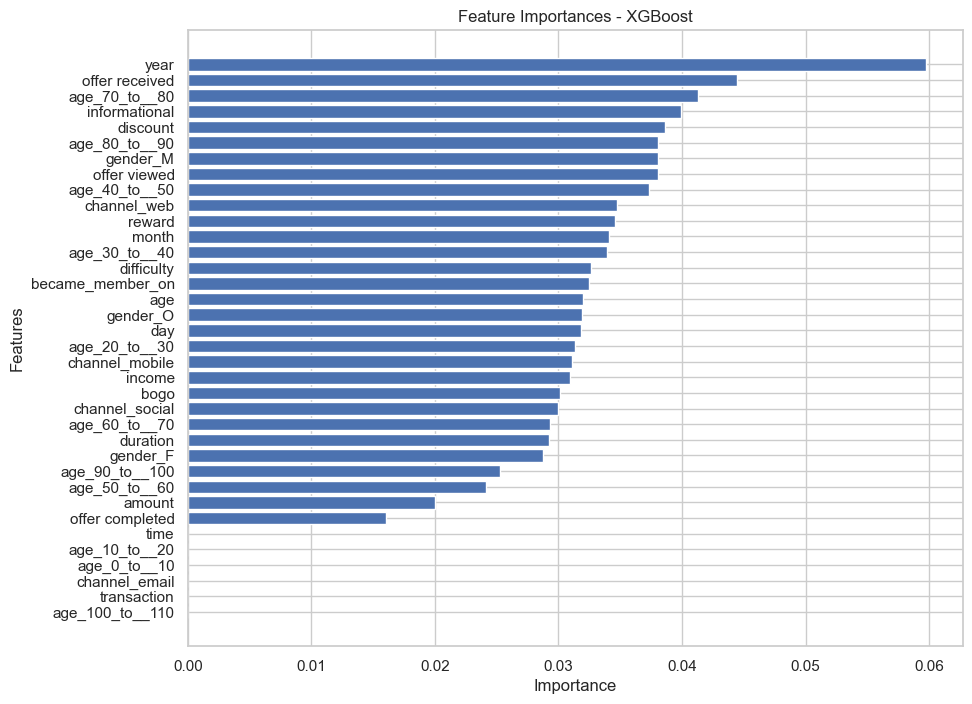

['year',
 'offer received',
 'age_70_to__80',
 'informational',
 'discount',
 'age_80_to__90',
 'gender_M',
 'offer viewed',
 'age_40_to__50',
 'channel_web',
 'reward',
 'month',
 'age_30_to__40',
 'difficulty',
 'became_member_on',
 'age',
 'gender_O',
 'day',
 'age_20_to__30',
 'channel_mobile',
 'income',
 'bogo',
 'channel_social',
 'age_60_to__70',
 'duration',
 'gender_F',
 'age_90_to__100',
 'age_50_to__60',
 'amount',
 'offer completed']

In [250]:
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances - XGBoost')
plt.gca().invert_yaxis()
plt.show()

# Selecting top features based on importance
selected_features = feature_importance_df['Feature'].head(30).tolist()
selected_features

In [251]:
# df_new.to_csv('Mldata.csv', index=False)

### it sound that channel email have no effect and also the transaction event and time so I will drop them 

In [252]:
# drop unimportant features
df_new=df_new.drop(['time','age_10_to__20','age_0_to__10','channel_email','transaction','age_100_to__110','customer_id','age_separation','offer_id','event','gender','offer_type'],axis=1)

In [253]:
df_new.to_csv('Mldata1.csv', index=False)

In [254]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score

In [255]:
# Standardizing the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [256]:
#Scaling the data max min scaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [257]:
### Logistic Regression

In [258]:
#logistic regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
logreg=LogisticRegression(max_iter=1000)
logreg.fit(X_train,y_train)
y_pred_lg=logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test,y_test)))
confusion_matrix = confusion_matrix(y_test,y_pred_lg)
print(confusion_matrix)
print(classification_report(y_test,y_pred_lg))


Accuracy of logistic regression classifier on test set: 0.79
[[2232    0]
 [ 603    0]]
              precision    recall  f1-score   support

         0.0       0.79      1.00      0.88      2232
         1.0       0.00      0.00      0.00       603

    accuracy                           0.79      2835
   macro avg       0.39      0.50      0.44      2835
weighted avg       0.62      0.79      0.69      2835



### Random Forest

In [259]:
#random forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=25)
rf=RandomForestClassifier()
rf.fit(X_train,y_train)
y_pred_rf=rf.predict(X_test)
print('Accuracy of random forest classifier on test set: {:.2f}'.format(rf.score(X_test,y_test)))
confusion_matrix = confusion_matrix(y_test,y_pred_rf)
print(confusion_matrix)
print(classification_report(y_test,y_pred_rf))


Accuracy of random forest classifier on test set: 0.78
[[2199   38]
 [ 588   10]]
              precision    recall  f1-score   support

         0.0       0.79      0.98      0.88      2237
         1.0       0.21      0.02      0.03       598

    accuracy                           0.78      2835
   macro avg       0.50      0.50      0.45      2835
weighted avg       0.67      0.78      0.70      2835



### svm 


In [260]:
#svm 
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
svm=SVC()
svm.fit(X_train,y_train)
y_pred_svm=svm.predict(X_test)
print('Accuracy of SVM classifier on test set: {:.2f}'.format(svm.score(X_test,y_test)))
confusion_matrix = confusion_matrix(y_test,y_pred_svm)
print(confusion_matrix)
print(classification_report(y_test,y_pred_svm))



Accuracy of SVM classifier on test set: 0.79
[[2232    0]
 [ 603    0]]
              precision    recall  f1-score   support

         0.0       0.79      1.00      0.88      2232
         1.0       0.00      0.00      0.00       603

    accuracy                           0.79      2835
   macro avg       0.39      0.50      0.44      2835
weighted avg       0.62      0.79      0.69      2835



### XGBoost

In [261]:
#xgboost
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score  
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=10)
xgb=XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb.fit(X_train,y_train)
y_pred_xgb=xgb.predict(X_test)  
print('Accuracy of XGBoost classifier on test set: {:.2f}'.format(xgb.score(X_test,y_test)))
confusion_matrix = confusion_matrix(y_test,y_pred_xgb)
print(confusion_matrix)
print(classification_report(y_test,y_pred_xgb))


Accuracy of XGBoost classifier on test set: 0.78
[[2181   63]
 [ 572   19]]
              precision    recall  f1-score   support

         0.0       0.79      0.97      0.87      2244
         1.0       0.23      0.03      0.06       591

    accuracy                           0.78      2835
   macro avg       0.51      0.50      0.46      2835
weighted avg       0.68      0.78      0.70      2835



### Decision Tree

In [262]:
#decision tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.35,random_state=10)
dt=DecisionTreeClassifier()
dt.fit(X_train,y_train)
y_pred_dt=dt.predict(X_test)
print('Accuracy of decision tree classifier on test set: {:.2f}'.format(dt.score(X_test,y_test)))
confusion_matrix = confusion_matrix(y_test,y_pred_dt)
print(confusion_matrix)
print(classification_report(y_test,y_pred_dt))

Accuracy of decision tree classifier on test set: 0.67
[[3117  793]
 [ 858  193]]
              precision    recall  f1-score   support

         0.0       0.78      0.80      0.79      3910
         1.0       0.20      0.18      0.19      1051

    accuracy                           0.67      4961
   macro avg       0.49      0.49      0.49      4961
weighted avg       0.66      0.67      0.66      4961



### KNN

In [263]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import numpy as np

# Convert to NumPy arrays if needed
X_train, X_test = np.array(X_train), np.array(X_test)
y_train, y_test = np.array(y_train), np.array(y_test)

# Initialize and fit the KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

# Make predictions
y_pred_knn = knn.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_knn)
conf_matrix = confusion_matrix(y_test, y_pred_knn)
class_report = classification_report(y_test, y_pred_knn)

print(f'Accuracy: {accuracy:.2f}')
print('Confusion Matrix:')
print(conf_matrix)
print('Classification Report:')
print(class_report)


Accuracy: 0.74
Confusion Matrix:
[[3570  340]
 [ 965   86]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.79      0.91      0.85      3910
         1.0       0.20      0.08      0.12      1051

    accuracy                           0.74      4961
   macro avg       0.49      0.50      0.48      4961
weighted avg       0.66      0.74      0.69      4961



In [267]:
from sklearn.metrics import roc_auc_score

# Assuming y_test and y_pred are your true labels and predicted probabilities, respectively
auc = roc_auc_score(y_test, y_pred_xgb)

print(f'AUC-ROC Score: {auc:.2f}')


ValueError: Found input variables with inconsistent numbers of samples: [4961, 2835]

In [268]:
models = [logreg, rf, svm, xgb, dt, knn]
model_names = ['Logistic Regression', 'Random Forest', 'SVM', 'XGBoost', 'Decision Tree', 'KNN']

for model, name in zip(models, model_names):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f'Accuracy of {name} on test set: {accuracy:.2f}')


Accuracy of Logistic Regression on test set: 0.79
Accuracy of Random Forest on test set: 0.78
Accuracy of SVM on test set: 0.79
Accuracy of XGBoost on test set: 0.77
Accuracy of Decision Tree on test set: 0.66
Accuracy of KNN on test set: 0.74


### Model evaluation

In [269]:
# Number of trees in random forest
n_estimators = [10, 50, 100, 150, 200, 250, 300, 350, 500]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.arange(3, 13)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_split_samples = [2, 5, 8]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

In [270]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Define the parameter grid
n_estimators = [10, 50, 100]
max_features = [1, 2, 3, None]  # Add None as an option
max_depth = [None, 10, 20]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]

# Initialize variables to track the best parameters and accuracy
best_params = None
best_accuracy = 0

# Loop through parameter combinations
for n_est in n_estimators:
    for max_feat in max_features:
        for max_d in max_depth:
            for min_split in min_samples_split:
                for min_leaf in min_samples_leaf:
                    # Create and train the Random Forest model
                    rf = RandomForestClassifier(
                        n_estimators=n_est,
                        max_features=max_feat,
                        max_depth=max_d,
                        min_samples_split=min_split,
                        min_samples_leaf=min_leaf
                    )
                    rf.fit(X_train, y_train)

                    # Make predictions on the test set
                    y_pred = rf.predict(X_test)

                    # Calculate accuracy
                    accuracy = accuracy_score(y_test, y_pred)

                    # Print or store results
                    print(f'Accuracy of Random Forest on test set: {accuracy:.2f}')
                    print(f'Parameters: n_estimators={n_est}, max_features={max_feat}, max_depth={max_d}, min_samples_split={min_split}, min_samples_leaf={min_leaf}')

                    # Update best parameters if current model is better
                    if accuracy > best_accuracy:
                        best_accuracy = accuracy
                        best_params = {
                            'n_estimators': n_est,
                            'max_features': max_feat,
                            'max_depth': max_d,
                            'min_samples_split': min_split,
                            'min_samples_leaf': min_leaf
                        }

# Print the best parameters and accuracy
print('\nBest Parameters:')
print(best_params)
print(f'Best Accuracy: {best_accuracy:.2f}')


Accuracy of Random Forest on test set: 0.76
Parameters: n_estimators=10, max_features=1, max_depth=None, min_samples_split=2, min_samples_leaf=1
Accuracy of Random Forest on test set: 0.78
Parameters: n_estimators=10, max_features=1, max_depth=None, min_samples_split=2, min_samples_leaf=2
Accuracy of Random Forest on test set: 0.79
Parameters: n_estimators=10, max_features=1, max_depth=None, min_samples_split=2, min_samples_leaf=4
Accuracy of Random Forest on test set: 0.77
Parameters: n_estimators=10, max_features=1, max_depth=None, min_samples_split=5, min_samples_leaf=1
Accuracy of Random Forest on test set: 0.78
Parameters: n_estimators=10, max_features=1, max_depth=None, min_samples_split=5, min_samples_leaf=2
Accuracy of Random Forest on test set: 0.79
Parameters: n_estimators=10, max_features=1, max_depth=None, min_samples_split=5, min_samples_leaf=4
Accuracy of Random Forest on test set: 0.78
Parameters: n_estimators=10, max_features=1, max_depth=None, min_samples_split=10, min

In [271]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Define the parameter grid
penalties = ['l2']
C_values = [0.001, 0.01, 0.1, 1, 10, 100, 1000]

# Initialize variables to track the best parameters and accuracy
best_params = None
best_accuracy = 0

# Loop through parameter combinations
for penalty in penalties:
    for C_value in C_values:
        # Create and train the Logistic Regression model
        logreg = LogisticRegression(penalty=penalty, C=C_value, solver='lbfgs', random_state=42)
        logreg.fit(X_train, y_train)

        # Make predictions on the test set
        y_pred = logreg.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)

        # Print or store results
        print(f'Accuracy of Logistic Regression on test set: {accuracy:.2f}')
        print(f'Parameters: penalty={penalty}, C={C_value}')

        # Update best parameters if the current model is better
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_params = {'penalty': penalty, 'C': C_value}

# Print the best parameters and accuracy
print('\nBest Parameters:')
print(best_params)
print(f'Best Accuracy: {best_accuracy:.2f}')


Accuracy of Logistic Regression on test set: 0.79
Parameters: penalty=l2, C=0.001
Accuracy of Logistic Regression on test set: 0.79
Parameters: penalty=l2, C=0.01
Accuracy of Logistic Regression on test set: 0.79
Parameters: penalty=l2, C=0.1
Accuracy of Logistic Regression on test set: 0.79
Parameters: penalty=l2, C=1
Accuracy of Logistic Regression on test set: 0.79
Parameters: penalty=l2, C=10
Accuracy of Logistic Regression on test set: 0.79
Parameters: penalty=l2, C=100
Accuracy of Logistic Regression on test set: 0.79
Parameters: penalty=l2, C=1000

Best Parameters:
{'penalty': 'l2', 'C': 0.001}
Best Accuracy: 0.79


In [273]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Define the parameter grid
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]
}

# Initialize logistic regression model
logreg = LogisticRegression(solver='lbfgs', random_state=42)

# Create GridSearchCV object
grid_search = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Print the best parameters and accuracy
print('Best Parameters:', grid_search.best_params_)
print('Best Accuracy:', grid_search.best_score_)

# Evaluate on the test set using the best model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print('Test Set Accuracy:', accuracy)


Best Parameters: {'C': 0.001, 'penalty': 'l2'}
Best Accuracy: 0.7841945607495686
Test Set Accuracy: 0.7881475508969966


In [272]:
# Define the parameter grid
kernel = ['linear', 'rbf']
C_values = [0.001, 0.01, 0.1, 1, 10, 100, 1000]


In [274]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Define classifiers and their respective parameter grids
classifiers = {
    'RandomForest': (RandomForestClassifier(), {'n_estimators': [10, 50, 100], 'max_depth': [None, 10, 20]}),
    'LogisticRegression': (LogisticRegression(), {'penalty': ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10]})
}

# Loop through classifiers
for clf_name, (clf, param_grid) in classifiers.items():
    print(f'\nPerforming Grid Search for {clf_name}')
    
    # Create GridSearchCV object
    grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy')
    
    # Fit the grid search to the data
    grid_search.fit(X_train, y_train)

    # Print the best parameters and accuracy
    print('Best Parameters:', grid_search.best_params_)
    print('Best Accuracy:', grid_search.best_score_)

    # Evaluate on the test set using the best model
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print('Test Set Accuracy:', accuracy)



Performing Grid Search for RandomForest
Best Parameters: {'max_depth': 10, 'n_estimators': 100}
Best Accuracy: 0.7840860420300896
Test Set Accuracy: 0.787542834106027

Performing Grid Search for LogisticRegression
Best Parameters: {'C': 0.001, 'penalty': 'l2'}
Best Accuracy: 0.7841945607495686
Test Set Accuracy: 0.7881475508969966


# Conclusion

After building and evaluating different models, Random Forest, Logistic Regression, and SVC have shown the best performance and metrics for our data, with the highest accuracy. These performances could be further improved by tuning the parameters in future phases. It is important to avoid overfitting when building models. Additionally, it would be interesting to test other classification algorithms like SVM or K-NN and include them in the general comparison.

ROC-AUC curve has been used to compare the different classification models:

An ROC curve (receiver operating characteristic curve) is a graph showing the performance of a classification model at all classification thresholds. This curve plots two parameters:

- True Positive Rate (TPR): Synonymous with recall and defined as TPR = TP / (TP + FN)

- False Positive Rate (FPR): Defined as FPR = FP / (FP + TN)

An ROC curve plots TPR vs. FPR at different classification thresholds. Lowering the classification threshold classifies more items as positive, thus increasing both False Positives and True Positives.

# Thank you for reading my notebook